In [1]:
import time
import warnings
from itertools import cycle, islice

import matplotlib.pyplot as plt
from scipy.io import arff
import pandas as pd
import numpy as np

from sklearn import datasets
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import pairwise_distances
from sklearn import metrics
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score


In [2]:
def dunn_idx(X,labels,centroids,distances):
    
    # Calculate within-cluster scatter (W)
    within_cluster_distances = []
    for i in range(len(centroids)):
        cluster_points = X[labels == i]
        cluster_distances = pairwise_distances(cluster_points, [centroids[i]])
        within_cluster_distances.extend(cluster_distances)
    W = np.mean(within_cluster_distances)

    # Calculate between-cluster separation (B)
    between_cluster_distances = []
    for i in range(len(centroids)):
        for j in range(i + 1, len(centroids)):
            cluster_distance = np.linalg.norm(centroids[i] - centroids[j])
            between_cluster_distances.append(cluster_distance)
    B = min(between_cluster_distances)

    # Calculate Dunn's Index
    dunn_index = W / B
    return dunn_index

In [3]:
#Xi_Beni_idx
def Xi_Beni_idx(X,labels,centroids):
    # Calculate pairwise distances between all points
    distances = pairwise_distances(X)

    # Calculate within-cluster scatter (W)
    within_cluster_distances = []
    for i in range(len(centroids)):
        cluster_points = X[labels == i]
        cluster_distances = pairwise_distances(cluster_points, [centroids[i]])
        within_cluster_distances.extend(cluster_distances)
    W = np.mean(within_cluster_distances)

    # Calculate between-cluster separation (B)
    between_cluster_distances = []
    for i in range(len(centroids)):
        for j in range(i + 1, len(centroids)):
            cluster_distance = np.linalg.norm(centroids[i] - centroids[j])
            between_cluster_distances.append(cluster_distance)
    B = np.mean(between_cluster_distances)
    XB_index = W / B
    # Calculate Xi-Beni (XB) Index
    return XB_index

In [4]:
complex9 = arff.loadarff('dataset/complex9.arff')
curves2 = arff.loadarff('dataset/curves2.arff')
diamond9 = arff.loadarff('dataset/diamond9.arff')
disk_5000n = arff.loadarff('dataset/disk-5000n.arff')
gaussians1 = arff.loadarff('dataset/gaussians1.arff')
hypercube = arff.loadarff('dataset/hypercube.arff')
impossible = arff.loadarff('dataset/impossible.arff')
disk_4000n = arff.loadarff('dataset/disk-4000n.arff')
mopsi_joensuu = arff.loadarff('dataset/mopsi-joensuu.arff')
sizes5 = arff.loadarff('dataset/sizes5.arff')

In [5]:
df_complex9 = pd.DataFrame(complex9[0])
df_curves2 = pd.DataFrame(curves2[0])
df_diamond9 = pd.DataFrame(diamond9[0])
df_disk_5000n = pd.DataFrame(disk_5000n[0])
df_gaussians1 = pd.DataFrame(gaussians1[0])
df_hypercube = pd.DataFrame(hypercube[0])
df_impossible = pd.DataFrame(impossible[0])
df_disk_4000n = pd.DataFrame(disk_4000n[0])
df_mopsi_joensuu = pd.DataFrame(mopsi_joensuu[0])
df_sizes5 = pd.DataFrame(sizes5[0])

np_complex9 = df_complex9.values
np_complex9 = np.delete(np_complex9, 2, axis=1)

np_curves2 = df_curves2.values
np_curves2 = np.delete(np_curves2, 2, axis=1)

np_diamond9 = df_diamond9.values
np_diamond9 = np.delete(np_diamond9, 2, axis=1)

np_disk_5000n = df_disk_5000n.values
np_disk_5000n = np.delete(np_disk_5000n, 2, axis=1)

np_gaussians1 = df_gaussians1.values
np_gaussians1 = np.delete(np_gaussians1, 2, axis=1)

np_hypercube = df_hypercube.values
np_hypercube = np.delete(np_hypercube, 2, axis=1)

np_impossible = df_impossible.values
np_impossible = np.delete(np_impossible, 2, axis=1)

np_disk_4000n = df_disk_4000n.values
np_disk_4000n = np.delete(np_disk_4000n, 2, axis=1)

np_mopsi_joensuu = df_mopsi_joensuu.values

np_sizes5 = df_sizes5.values
np_sizes5 = np.delete(np_sizes5, 2, axis=1)


x=np_complex9[:,0]
y=np_complex9[:,1]


In [ ]:
plt.figure(1)
plt.figure(1).suptitle('Dataset', fontsize=60)
plt.rcParams["figure.figsize"] = (100,10) 
# For complex9 Function 
plt.subplot(1,10,1)
plt.scatter(np_complex9[:,0],np_complex9[:,1],color='black')
plt.title("complex9", fontsize=45, y=-0.14) 
plt.grid()
# For curves2 Function 
plt.subplot(1,10,2)
plt.scatter(np_curves2[:,0],np_curves2[:,1],color='black')
plt.title("curves2", fontsize=45, y=-0.14) 
plt.grid()
# For diamond9 Function 
plt.subplot(1,10,3)
plt.scatter(np_diamond9[:,0],np_diamond9[:,1],color='black')
plt.title("diamond9", fontsize=45, y=-0.14) 
plt.grid()
# For disk-5000n Function 
plt.subplot(1,10,4)
plt.scatter(np_disk_5000n[:,0],np_disk_5000n[:,1],color='black')
plt.title("disk-5000n", fontsize=45, y=-0.14) 
plt.grid()
# For gaussians1 Function 
plt.subplot(1,10,5)
plt.scatter(np_gaussians1[:,0],np_gaussians1[:,1],color='black')
plt.title("gaussians1", fontsize=45, y=-0.14) 
plt.grid()
# For hypercube Function 
plt.subplot(1,10,6)
plt.scatter(np_hypercube[:,0],np_hypercube[:,1],color='black')
plt.title("hypercube", fontsize=45, y=-0.14) 
plt.grid()
# For impossible Function 
plt.subplot(1,10,7)
plt.scatter(np_impossible[:,0],np_impossible[:,1],color='black')
plt.title("impossible", fontsize=45, y=-0.14) 
plt.grid()
# For disk-4000n Function 
plt.subplot(1,10,8)
plt.scatter(np_disk_4000n[:,0],np_disk_4000n[:,1],color='black')
plt.title("disk-4000n", fontsize=45, y=-0.14) 
plt.grid()
# For mopsi-joensuu Function 
plt.subplot(1,10,9)
plt.scatter(np_mopsi_joensuu[:,0],np_mopsi_joensuu[:,1],color='black')
plt.title("mopsi-joensuu", fontsize=45, y=-0.14) 
plt.grid()
# For sizes5 Function 
plt.subplot(1,10,10)
plt.scatter(np_sizes5[:,0],np_sizes5[:,1],color='black')
plt.title("sizes5", fontsize=45, y=-0.14) 
plt.grid()
# Save the plot
plt.savefig('data_set_scatter_plot.png')
plt.show() 

In [7]:
colormap=np.array(['Red','green','blue','orange','purple','brown','pink','lightblue','maroon','gray','olive','cyan','aqua','fuchsia','navy','gold','lawngreen','indigo','honeydew','tomato','forestgreen','teal','aquamarine','azure','chartreuse','limegreen','coral','crimson','darkblue','royalblue','silver','lime','darkgreen','beige','black'])

In [8]:
#KMean
from sklearn.cluster import KMeans

In [9]:
n_clusters_var=10
random_state_var=0
n_init_var="auto"
max_iter_var=300

In [10]:
model_kmeans_complex9=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_complex9.fit(np_complex9)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [11]:
model_kmeans_curves2=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_curves2.fit(np_curves2)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [12]:
model_kmeans_diamond9=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_diamond9.fit(np_diamond9)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [13]:
model_kmeans_disk_5000n=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_disk_5000n.fit(np_disk_5000n)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [14]:
model_kmeans_gaussians1=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_gaussians1.fit(np_gaussians1)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [15]:
model_kmeans_hypercube=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_hypercube.fit(np_hypercube)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [16]:
model_kmeans_impossible=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_impossible.fit(np_impossible)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [17]:
model_kmeans_disk_4000n=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_disk_4000n.fit(np_disk_4000n)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [18]:
model_kmeans_mopsi_joensuu=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_mopsi_joensuu.fit(np_mopsi_joensuu)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [19]:
model_kmeans_sizes5=KMeans(n_clusters=n_clusters_var,random_state=random_state_var, n_init=n_init_var, max_iter=max_iter_var)
model_kmeans_sizes5.fit(np_sizes5)

KMeans(n_clusters=10, n_init='auto', random_state=0)

In [20]:
print("Dunn Index")

dunn_index_complex9 = dunn_idx(np_complex9,model_kmeans_complex9.labels_,model_kmeans_complex9.cluster_centers_,pairwise_distances(np_complex9))
print(f"Dunn Index of complex9: {dunn_index_complex9}")

dunn_index_curves2 = dunn_idx(np_curves2,model_kmeans_curves2.labels_,model_kmeans_curves2.cluster_centers_,pairwise_distances(np_curves2))
print(f"Dunn Index of curves2:  {dunn_index_curves2}")

dunn_index_diamond9 = dunn_idx(np_diamond9, model_kmeans_diamond9.labels_,model_kmeans_diamond9.cluster_centers_,pairwise_distances(np_diamond9))
print(f"Dunn Index of diamond9: {dunn_index_diamond9}")

dunn_index_disk_5000n = dunn_idx(np_disk_5000n,model_kmeans_disk_5000n.labels_,model_kmeans_disk_5000n.cluster_centers_,pairwise_distances(np_disk_5000n))
print(f"Dunn Index of disk-5000n:  {dunn_index_disk_5000n}")

dunn_index_gaussians1 = dunn_idx(np_gaussians1, model_kmeans_gaussians1.labels_,model_kmeans_gaussians1.cluster_centers_,pairwise_distances(np_gaussians1))
print(f"Dunn Index of gaussians1: {dunn_index_gaussians1}")

dunn_index_hypercube = dunn_idx(np_hypercube, model_kmeans_hypercube.labels_,model_kmeans_hypercube.cluster_centers_,pairwise_distances(np_hypercube))
print(f"Dunn Index of hypercube:  {dunn_index_hypercube}")

dunn_index_impossible = dunn_idx(np_impossible, model_kmeans_impossible.labels_,model_kmeans_impossible.cluster_centers_,pairwise_distances(np_impossible))
print(f"Dunn Index of impossible: {dunn_index_impossible}")

dunn_index_disk_4000n = dunn_idx(np_disk_4000n, model_kmeans_disk_4000n.labels_,model_kmeans_disk_4000n.cluster_centers_,pairwise_distances(np_disk_4000n))
print(f"Dunn Index of disk-4000n:  {dunn_index_disk_4000n}")

dunn_index_mopsi_joensuu = dunn_idx(np_mopsi_joensuu, model_kmeans_mopsi_joensuu.labels_,model_kmeans_mopsi_joensuu.cluster_centers_,pairwise_distances(np_mopsi_joensuu))
print(f"Dunn Index of mopsi_joensuu: {dunn_index_mopsi_joensuu}")

dunn_index_sizes5 = dunn_idx(np_sizes5, model_kmeans_sizes5.labels_,model_kmeans_sizes5.cluster_centers_,pairwise_distances(np_sizes5))
print(f"Dunn Index of sizes5:  {dunn_index_sizes5}")
print("\n")

print("Davies Bouldin Index")
db_index_complex9 = davies_bouldin_score(np_complex9, model_kmeans_complex9.labels_)
print(f"Davies-Bouldin Index of complex9: {db_index_complex9}")

db_index_curves2 = davies_bouldin_score(np_curves2, model_kmeans_curves2.labels_)
print(f"Davies-Bouldin Index of curves2:  {db_index_curves2}")

db_index_diamond9 = davies_bouldin_score(np_diamond9, model_kmeans_diamond9.labels_)
print(f"Davies-Bouldin Index of diamond9: {db_index_diamond9}")

db_index_disk_5000n = davies_bouldin_score(np_disk_5000n, model_kmeans_disk_5000n.labels_)
print(f"Davies-Bouldin Index of disk-5000n:  {db_index_disk_5000n}")

db_index_gaussians1 = davies_bouldin_score(np_gaussians1, model_kmeans_gaussians1.labels_)
print(f"Davies-Bouldin Index of gaussians1: {db_index_gaussians1}")

db_index_hypercube = davies_bouldin_score(np_hypercube, model_kmeans_hypercube.labels_)
print(f"Davies-Bouldin Index of hypercube:  {db_index_hypercube}")

db_index_impossible = davies_bouldin_score(np_impossible, model_kmeans_impossible.labels_)
print(f"Davies-Bouldin Index of impossible: {db_index_impossible}")

db_index_disk_4000n = davies_bouldin_score(np_disk_4000n, model_kmeans_disk_4000n.labels_)
print(f"Davies-Bouldin Indexof disk-4000n:  {db_index_disk_4000n}")

db_index_mopsi_joensuu = davies_bouldin_score(np_mopsi_joensuu, model_kmeans_mopsi_joensuu.labels_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {db_index_mopsi_joensuu}")

db_index_sizes5 = davies_bouldin_score(np_sizes5, model_kmeans_sizes5.labels_)
print(f"Davies-Bouldin Index of sizes5:  {db_index_sizes5}")
print("\n")

print("Xi-Beni Index")
xb_index_complex9 = Xi_Beni_idx(np_complex9, model_kmeans_complex9.labels_ ,model_kmeans_complex9.cluster_centers_)
print(f"Davies-Bouldin Index of complex9: {xb_index_complex9}")

xb_index_curves2 = Xi_Beni_idx(np_curves2, model_kmeans_curves2.labels_ , model_kmeans_curves2.cluster_centers_)
print(f"Davies-Bouldin Indexof curves2:  {xb_index_curves2}")

xb_index_diamond9 = Xi_Beni_idx(np_diamond9, model_kmeans_diamond9.labels_ ,model_kmeans_diamond9.cluster_centers_)
print(f"Davies-Bouldin Index of diamond9: {xb_index_diamond9}")

xb_index_disk_5000n = Xi_Beni_idx(np_disk_5000n, model_kmeans_disk_5000n.labels_ ,model_kmeans_disk_5000n.cluster_centers_)
print(f"Davies-Bouldin Indexof disk-5000n:  {xb_index_disk_5000n}")

xb_index_gaussians1 = Xi_Beni_idx(np_gaussians1, model_kmeans_gaussians1.labels_ ,model_kmeans_gaussians1.cluster_centers_)
print(f"Davies-Bouldin Index of gaussians1: {xb_index_gaussians1}")

xb_index_hypercube = Xi_Beni_idx(np_hypercube, model_kmeans_hypercube.labels_ ,model_kmeans_hypercube.cluster_centers_)
print(f"Davies-Bouldin Index of hypercube:  {xb_index_hypercube}")

xb_index_impossible = Xi_Beni_idx(np_impossible, model_kmeans_impossible.labels_ ,model_kmeans_impossible.cluster_centers_)
print(f"Davies-Bouldin Index of impossible: {xb_index_impossible}")

xb_index_disk_4000n = Xi_Beni_idx(np_disk_4000n, model_kmeans_disk_4000n.labels_ ,model_kmeans_disk_4000n.cluster_centers_)
print(f"Davies-Bouldin Index of disk-4000n:  {xb_index_disk_4000n}")

xb_index_mopsi_joensuu = Xi_Beni_idx(np_mopsi_joensuu, model_kmeans_mopsi_joensuu.labels_ ,model_kmeans_mopsi_joensuu.cluster_centers_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {xb_index_mopsi_joensuu}")

xb_index_sizes5 = Xi_Beni_idx(np_sizes5, model_kmeans_sizes5.labels_ ,model_kmeans_sizes5.cluster_centers_)
print(f"Davies-Bouldin Index of sizes5:  {xb_index_sizes5}")
print("\n")

print("Silhouette Score")
ss_index_complex9 = silhouette_score(np_complex9, model_kmeans_complex9.labels_ )
print(f"Silhouette Score of complex9: {ss_index_complex9}")

ss_index_curves2 = silhouette_score(np_curves2, model_kmeans_curves2.labels_ )
print(f"Silhouette Score of curves2:  {ss_index_curves2}")

ss_index_diamond9 = silhouette_score(np_diamond9, model_kmeans_diamond9.labels_ )
print(f"Silhouette Score  of diamond9: {ss_index_diamond9}")

ss_index_disk_5000n = silhouette_score(np_disk_5000n, model_kmeans_disk_5000n.labels_ )
print(f"Silhouette Score of disk-5000n:  {ss_index_disk_5000n}")

ss_index_gaussians1 = silhouette_score(np_gaussians1, model_kmeans_gaussians1.labels_ )
print(f"Silhouette Score  of gaussians1: {ss_index_gaussians1}")

ss_index_hypercube = silhouette_score(np_hypercube, model_kmeans_hypercube.labels_ )
print(f"Silhouette Score of hypercube:  {ss_index_hypercube}")

ss_index_impossible = silhouette_score(np_impossible, model_kmeans_impossible.labels_ )
print(f"Silhouette Score  of impossible: {ss_index_impossible}")

ss_index_disk_4000n = silhouette_score(np_disk_4000n, model_kmeans_disk_4000n.labels_ )
print(f"Silhouette Score of disk-4000n:  {ss_index_disk_4000n}")

ss_index_mopsi_joensuu = silhouette_score(np_mopsi_joensuu, model_kmeans_mopsi_joensuu.labels_ )
print(f"Silhouette Score of mopsi_joensuu: {ss_index_mopsi_joensuu}")

ss_index_sizes5 = silhouette_score(np_sizes5, model_kmeans_sizes5.labels_ )
print(f"Silhouette Score of sizes5:  {ss_index_sizes5}")

Dunn Index
Dunn Index of complex9: 0.5361409028917818
Dunn Index of curves2:  0.2560706505330715
Dunn Index of diamond9: 0.630399476620477
Dunn Index of disk-5000n:  0.47073168127332965
Dunn Index of gaussians1: 0.4644156909238215
Dunn Index of hypercube:  0.7439573141413507
Dunn Index of impossible: 0.4987422736333133
Dunn Index of disk-4000n:  0.5173009984787041
Dunn Index of mopsi_joensuu: 0.5694433420305289
Dunn Index of sizes5:  0.6103214671787258


Davies Bouldin Index
Davies-Bouldin Index of complex9: 0.8521833254025373
Davies-Bouldin Index of curves2:  0.5045312114261948
Davies-Bouldin Index of diamond9: 0.6641350738128897
Davies-Bouldin Index of disk-5000n:  0.8093823817744269
Davies-Bouldin Index of gaussians1: 0.830883954016382
Davies-Bouldin Index of hypercube:  0.6333426987105957
Davies-Bouldin Index of impossible: 0.8458436690554771
Davies-Bouldin Indexof disk-4000n:  0.8167965672801902
Davies-Bouldin Index of mopsi_joensuu: 0.659970527086374
Davies-Bouldin Index of sizes

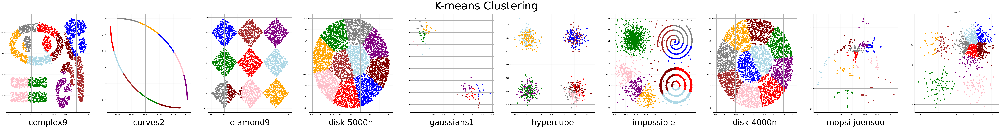

In [21]:
plt.figure(2)
plt.figure(2).suptitle('K-means Clustering', fontsize=60)
plt.rcParams["figure.figsize"] = (100,10) 
# For complex9 Function 
plt.subplot(1,10,1)
plt.scatter(np_complex9[:,0],np_complex9[:,1],c=colormap[model_kmeans_complex9.labels_])
plt.title("complex9", fontsize=45, y=-0.14) 
plt.grid()
# For curves2 Function 
plt.subplot(1,10,2)
plt.scatter(np_curves2[:,0],np_curves2[:,1],c=colormap[model_kmeans_curves2.labels_])
plt.title("curves2", fontsize=45, y=-0.14) 
plt.grid()
# For diamond9 Function 
plt.subplot(1,10,3)
plt.scatter(np_diamond9[:,0],np_diamond9[:,1],c=colormap[model_kmeans_diamond9.labels_])
plt.title("diamond9", fontsize=45, y=-0.14) 
plt.grid()
# For disk-5000n Function 
plt.subplot(1,10,4)
plt.scatter(np_disk_5000n[:,0],np_disk_5000n[:,1],c=colormap[model_kmeans_disk_5000n.labels_])
plt.title("disk-5000n", fontsize=45, y=-0.14) 
plt.grid()
# For gaussians1 Function 
plt.subplot(1,10,5)
plt.scatter(np_gaussians1[:,0],np_gaussians1[:,1],c=colormap[model_kmeans_gaussians1.labels_])
plt.title("gaussians1", fontsize=45, y=-0.14) 
plt.grid()
# For hypercube Function 
plt.subplot(1,10,6)
plt.scatter(np_hypercube[:,0],np_hypercube[:,1],c=colormap[model_kmeans_hypercube.labels_])
plt.title("hypercube", fontsize=45, y=-0.14) 
plt.grid()
# For impossible Function 
plt.subplot(1,10,7)
plt.scatter(np_impossible[:,0],np_impossible[:,1],c=colormap[model_kmeans_impossible.labels_])
plt.title("impossible", fontsize=45, y=-0.14) 
plt.grid()
# For disk-4000n Function 
plt.subplot(1,10,8)
plt.scatter(np_disk_4000n[:,0],np_disk_4000n[:,1],c=colormap[model_kmeans_disk_4000n.labels_])
plt.title("disk-4000n", fontsize=45, y=-0.14) 
plt.grid()
# For mopsi-joensuu Function 
plt.subplot(1,10,9)
plt.scatter(np_mopsi_joensuu[:,0],np_mopsi_joensuu[:,1],c=colormap[model_kmeans_mopsi_joensuu.labels_])
plt.title("mopsi-joensuu", fontsize=45, y=-0.14) 
plt.grid()
# For sizes5 Function 
plt.subplot(1,10,10)
plt.scatter(np_sizes5[:,0],np_sizes5[:,1],c=colormap[model_kmeans_sizes5.labels_])
plt.title("sizes5") 
plt.grid()
# Save the plot
plt.savefig('k_mean_scatter_plot.png')
plt.show() 

In [22]:
#DBScan
from sklearn.cluster import DBSCAN

In [23]:
eps_db=16
min_samples_db=10

In [24]:
model_dbscan_complex9=DBSCAN(eps=eps_db, min_samples=min_samples_db)
model_dbscan_complex9.fit(np_complex9)

DBSCAN(eps=16, min_samples=10)

In [25]:
model_dbscan_curves2=DBSCAN(eps=eps_db/10000, min_samples=min_samples_db)
model_dbscan_curves2.fit(np_curves2)

DBSCAN(eps=0.0016, min_samples=10)

In [26]:
model_dbscan_diamond9=DBSCAN(eps=eps_db/100, min_samples=min_samples_db)
model_dbscan_diamond9.fit(np_diamond9)

DBSCAN(eps=0.16, min_samples=10)

In [27]:
model_dbscan_disk_5000n=DBSCAN(eps=eps_db/10, min_samples=2)
model_dbscan_disk_5000n.fit(np_disk_5000n)

DBSCAN(eps=1.6, min_samples=2)

In [28]:
model_dbscan_gaussians1=DBSCAN(eps=eps_db/100, min_samples=min_samples_db)
model_dbscan_gaussians1.fit(np_gaussians1)

DBSCAN(eps=0.16, min_samples=10)

In [29]:
model_dbscan_hypercube=DBSCAN(eps=eps_db/100, min_samples=min_samples_db)
model_dbscan_hypercube.fit(np_hypercube)

DBSCAN(eps=0.16, min_samples=10)

In [30]:
model_dbscan_impossible=DBSCAN(eps=eps_db/16, min_samples=8)
model_dbscan_impossible.fit(np_impossible)

DBSCAN(eps=1.0, min_samples=8)

In [31]:
model_dbscan_disk_4000n=DBSCAN(eps=eps_db/10, min_samples=2)
model_dbscan_disk_4000n.fit(np_disk_4000n)

DBSCAN(eps=1.6, min_samples=2)

In [32]:
model_dbscan_mopsi_joensuu=DBSCAN(eps=eps_db/80, min_samples=10)
model_dbscan_mopsi_joensuu.fit(np_mopsi_joensuu)

DBSCAN(eps=0.2, min_samples=10)

In [33]:
model_dbscan_sizes5=DBSCAN(eps=eps_db/20, min_samples=8)
model_dbscan_sizes5.fit(np_sizes5)

DBSCAN(eps=0.8, min_samples=8)

In [34]:
labels_dbscan_complex9 = model_dbscan_complex9.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_complex9)) - (1 if -1 in labels_dbscan_complex9 else 0)
n_noise_ = list(labels_dbscan_complex9).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 9
Estimated number of noise points: 5


In [35]:
labels_dbscan_curves2 = model_dbscan_curves2.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_curves2)) - (1 if -1 in labels_dbscan_curves2 else 0)
n_noise_ = list(labels_dbscan_curves2).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 0


In [36]:
labels_dbscan_diamond9 = model_dbscan_diamond9.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_diamond9)) - (1 if -1 in labels_dbscan_diamond9 else 0)
n_noise_ = list(labels_dbscan_diamond9).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 9
Estimated number of noise points: 28


In [37]:
labels_dbscan_disk_5000n = model_dbscan_disk_5000n.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_disk_5000n)) - (1 if -1 in labels_dbscan_disk_5000n else 0)
n_noise_ = list(labels_dbscan_disk_5000n).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 1
Estimated number of noise points: 0


In [38]:
labels_dbscan_gaussians1 = model_dbscan_gaussians1.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_gaussians1)) - (1 if -1 in labels_dbscan_gaussians1 else 0)
n_noise_ = list(labels_dbscan_gaussians1).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 0


In [39]:
labels_dbscan_impossible = model_dbscan_impossible.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_impossible)) - (1 if -1 in labels_dbscan_impossible else 0)
n_noise_ = list(labels_dbscan_impossible).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 4
Estimated number of noise points: 54


In [40]:
labels_dbscan_disk_4000n = model_dbscan_disk_4000n.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_disk_4000n)) - (1 if -1 in labels_dbscan_disk_4000n else 0)
n_noise_ = list(labels_dbscan_disk_4000n).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 1
Estimated number of noise points: 0


In [41]:
labels_dbscan_mopsi_joensuu = model_dbscan_mopsi_joensuu.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_mopsi_joensuu)) - (1 if -1 in labels_dbscan_mopsi_joensuu else 0)
n_noise_ = list(labels_dbscan_mopsi_joensuu).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 9
Estimated number of noise points: 77


In [42]:
labels_dbscan_sizes5 = model_dbscan_sizes5.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_dbscan_sizes5)) - (1 if -1 in labels_dbscan_sizes5 else 0)
n_noise_ = list(labels_dbscan_sizes5).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 6
Estimated number of noise points: 227


In [43]:
def renum_label(label,colormap):
    
    for i in range(label.shape[0]):
        if(label[i]==-1):
            label[i] = len(colormap)-1
        else:
            label[i] = label[i]+1
    return label

In [44]:
print("dbscan")
db_index_complex9 = davies_bouldin_score(np_complex9, model_dbscan_complex9.labels_)
print(f"Davies-Bouldin Index of complex9: {db_index_complex9}")

db_index_curves2 = davies_bouldin_score(np_curves2, model_dbscan_curves2.labels_)
print(f"Davies-Bouldin Indexof curves2:  {db_index_curves2}")

db_index_diamond9 = davies_bouldin_score(np_diamond9, model_dbscan_diamond9.labels_)
print(f"Davies-Bouldin Index of diamond9: {db_index_diamond9}")

#db_index_disk_5000n = davies_bouldin_score(np_disk_5000n, model_dbscan_disk_5000n.labels_)
#print(f"Davies-Bouldin Indexof disk-5000n:  {db_index_disk_5000n}")

db_index_gaussians1 = davies_bouldin_score(np_gaussians1, model_dbscan_gaussians1.labels_)
print(f"Davies-Bouldin Index of gaussians1: {db_index_gaussians1}")

db_index_hypercube = davies_bouldin_score(np_hypercube, model_dbscan_hypercube.labels_)
print(f"Davies-Bouldin Indexof hypercube:  {db_index_hypercube}")

db_index_impossible = davies_bouldin_score(np_impossible, model_dbscan_impossible.labels_)
print(f"Davies-Bouldin Index of impossible: {db_index_impossible}")

#db_index_disk_4000n = davies_bouldin_score(np_disk_4000n, model_dbscan_disk_4000n.labels_)
#print(f"Davies-Bouldin Indexof disk-4000n:  {db_index_disk_4000n}")

db_index_mopsi_joensuu = davies_bouldin_score(np_mopsi_joensuu, model_dbscan_mopsi_joensuu.labels_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {db_index_mopsi_joensuu}")

db_index_sizes5 = davies_bouldin_score(np_sizes5, model_dbscan_sizes5.labels_)
print(f"Davies-Bouldin Indexof sizes5:  {db_index_sizes5}")

dbscan
Davies-Bouldin Index of complex9: 2.4651229156014134
Davies-Bouldin Indexof curves2:  1.4750916250337307
Davies-Bouldin Index of diamond9: 2.3378373458397936
Davies-Bouldin Index of gaussians1: 0.19115128249343355
Davies-Bouldin Indexof hypercube:  0.2573756946074145
Davies-Bouldin Index of impossible: 1.6993770799423502
Davies-Bouldin Index of mopsi_joensuu: 2.0153199222026768
Davies-Bouldin Indexof sizes5:  1.2599509135940379


In [53]:
'''
print("Dunn Index")

dunn_index_complex9 = dunn_idx(np_complex9,model_dbscan_complex9.labels_,model_dbscan_complex9.cluster_centers_,pairwise_distances(np_complex9))
print(f"Dunn Index of complex9: {dunn_index_complex9}")

dunn_index_curves2 = dunn_idx(np_curves2,model_dbscan_curves2.labels_,model_dbscan_curves2.cluster_centers_,pairwise_distances(np_curves2))
print(f"Dunn Index of curves2:  {dunn_index_curves2}")

dunn_index_diamond9 = dunn_idx(np_diamond9, model_dbscan_diamond9.labels_,model_dbscan_diamond9.cluster_centers_,pairwise_distances(np_diamond9))
print(f"Dunn Index of diamond9: {dunn_index_diamond9}")

dunn_index_disk_5000n = dunn_idx(np_disk_5000n,model_dbscan_disk_5000n.labels_,model_dbscan_disk_5000n.cluster_centers_,pairwise_distances(np_disk_5000n))
print(f"Dunn Index of disk-5000n:  {dunn_index_disk_5000n}")

dunn_index_gaussians1 = dunn_idx(np_gaussians1, model_dbscan_gaussians1.labels_,model_dbscan_gaussians1.cluster_centers_,pairwise_distances(np_gaussians1))
print(f"Dunn Index of gaussians1: {dunn_index_gaussians1}")

dunn_index_hypercube = dunn_idx(np_hypercube, model_dbscan_hypercube.labels_,model_dbscan_hypercube.cluster_centers_,pairwise_distances(np_hypercube))
print(f"Dunn Index of hypercube:  {dunn_index_hypercube}")

dunn_index_impossible = dunn_idx(np_impossible, model_dbscan_impossible.labels_,model_dbscan_impossible.cluster_centers_,pairwise_distances(np_impossible))
print(f"Dunn Index of impossible: {dunn_index_impossible}")

dunn_index_disk_4000n = dunn_idx(np_disk_4000n, model_dbscan_disk_4000n.labels_,model_dbscan_disk_4000n.cluster_centers_,pairwise_distances(np_disk_4000n))
print(f"Dunn Index of disk-4000n:  {dunn_index_disk_4000n}")

dunn_index_mopsi_joensuu = dunn_idx(np_mopsi_joensuu, model_dbscan_mopsi_joensuu.labels_,model_dbscan_mopsi_joensuu.cluster_centers_,pairwise_distances(np_mopsi_joensuu))
print(f"Dunn Index of mopsi_joensuu: {dunn_index_mopsi_joensuu}")

dunn_index_sizes5 = dunn_idx(np_sizes5, model_dbscan_sizes5.labels_,model_dbscan_sizes5.cluster_centers_,pairwise_distances(np_sizes5))
print(f"Dunn Index of sizes5:  {dunn_index_sizes5}")
print("\n")
'''
print("Davies Bouldin Index")
db_index_complex9 = davies_bouldin_score(np_complex9, model_dbscan_complex9.labels_)
print(f"Davies-Bouldin Index of complex9: {db_index_complex9}")

db_index_curves2 = davies_bouldin_score(np_curves2, model_dbscan_curves2.labels_)
print(f"Davies-Bouldin Index of curves2:  {db_index_curves2}")

db_index_diamond9 = davies_bouldin_score(np_diamond9, model_dbscan_diamond9.labels_)
print(f"Davies-Bouldin Index of diamond9: {db_index_diamond9}")

#db_index_disk_5000n = davies_bouldin_score(np_disk_5000n, model_dbscan_disk_5000n.labels_)
#print(f"Davies-Bouldin Index of disk-5000n:  {db_index_disk_5000n}")

db_index_gaussians1 = davies_bouldin_score(np_gaussians1, model_dbscan_gaussians1.labels_)
print(f"Davies-Bouldin Index of gaussians1: {db_index_gaussians1}")

db_index_hypercube = davies_bouldin_score(np_hypercube, model_dbscan_hypercube.labels_)
print(f"Davies-Bouldin Index of hypercube:  {db_index_hypercube}")

db_index_impossible = davies_bouldin_score(np_impossible, model_dbscan_impossible.labels_)
print(f"Davies-Bouldin Index of impossible: {db_index_impossible}")

#db_index_disk_4000n = davies_bouldin_score(np_disk_4000n, model_dbscan_disk_4000n.labels_)
#print(f"Davies-Bouldin Indexof disk-4000n:  {db_index_disk_4000n}")

db_index_mopsi_joensuu = davies_bouldin_score(np_mopsi_joensuu, model_dbscan_mopsi_joensuu.labels_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {db_index_mopsi_joensuu}")

db_index_sizes5 = davies_bouldin_score(np_sizes5, model_dbscan_sizes5.labels_)
print(f"Davies-Bouldin Index of sizes5:  {db_index_sizes5}")
print("\n")
'''
print("Xi-Beni Index")
xb_index_complex9 = Xi_Beni_idx(np_complex9, model_dbscan_complex9.labels_ ,model_dbscan_complex9.cluster_centers_)
print(f"Davies-Bouldin Index of complex9: {xb_index_complex9}")

xb_index_curves2 = Xi_Beni_idx(np_curves2, model_dbscan_curves2.labels_ , model_dbscan_curves2.cluster_centers_)
print(f"Davies-Bouldin Indexof curves2:  {xb_index_curves2}")

xb_index_diamond9 = Xi_Beni_idx(np_diamond9, model_dbscan_diamond9.labels_ ,model_dbscan_diamond9.cluster_centers_)
print(f"Davies-Bouldin Index of diamond9: {xb_index_diamond9}")

xb_index_disk_5000n = Xi_Beni_idx(np_disk_5000n, model_dbscan_disk_5000n.labels_ ,model_dbscan_disk_5000n.cluster_centers_)
print(f"Davies-Bouldin Indexof disk-5000n:  {xb_index_disk_5000n}")

xb_index_gaussians1 = Xi_Beni_idx(np_gaussians1, model_dbscan_gaussians1.labels_ ,model_dbscan_gaussians1.cluster_centers_)
print(f"Davies-Bouldin Index of gaussians1: {xb_index_gaussians1}")

xb_index_hypercube = Xi_Beni_idx(np_hypercube, model_dbscan_hypercube.labels_ ,model_dbscan_hypercube.cluster_centers_)
print(f"Davies-Bouldin Index of hypercube:  {xb_index_hypercube}")

xb_index_impossible = Xi_Beni_idx(np_impossible, model_dbscan_impossible.labels_ ,model_dbscan_impossible.cluster_centers_)
print(f"Davies-Bouldin Index of impossible: {xb_index_impossible}")

xb_index_disk_4000n = Xi_Beni_idx(np_disk_4000n, model_dbscan_disk_4000n.labels_ ,model_dbscan_disk_4000n.cluster_centers_)
print(f"Davies-Bouldin Index of disk-4000n:  {xb_index_disk_4000n}")

xb_index_mopsi_joensuu = Xi_Beni_idx(np_mopsi_joensuu, model_dbscan_mopsi_joensuu.labels_ ,model_dbscan_mopsi_joensuu.cluster_centers_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {xb_index_mopsi_joensuu}")

xb_index_sizes5 = Xi_Beni_idx(np_sizes5, model_dbscan_sizes5.labels_ ,model_dbscan_sizes5.cluster_centers_)
print(f"Davies-Bouldin Index of sizes5:  {xb_index_sizes5}")
print("\n")
'''
print("Silhouette Score")
ss_index_complex9 = silhouette_score(np_complex9, model_dbscan_complex9.labels_ )
print(f"Silhouette Score of complex9: {ss_index_complex9}")

ss_index_curves2 = silhouette_score(np_curves2, model_dbscan_curves2.labels_ )
print(f"Silhouette Score of curves2:  {ss_index_curves2}")

ss_index_diamond9 = silhouette_score(np_diamond9, model_dbscan_diamond9.labels_ )
print(f"Silhouette Score  of diamond9: {ss_index_diamond9}")

#ss_index_disk_5000n = silhouette_score(np_disk_5000n, model_dbscan_disk_5000n.labels_ )
#print(f"Silhouette Score of disk-5000n:  {ss_index_disk_5000n}")

ss_index_gaussians1 = silhouette_score(np_gaussians1, model_dbscan_gaussians1.labels_ )
print(f"Silhouette Score  of gaussians1: {ss_index_gaussians1}")

ss_index_hypercube = silhouette_score(np_hypercube, model_dbscan_hypercube.labels_ )
print(f"Silhouette Score of hypercube:  {ss_index_hypercube}")

ss_index_impossible = silhouette_score(np_impossible, model_dbscan_impossible.labels_ )
print(f"Silhouette Score  of impossible: {ss_index_impossible}")

#ss_index_disk_4000n = silhouette_score(np_disk_4000n, model_dbscan_disk_4000n.labels_ )
#print(f"Silhouette Score of disk-4000n:  {ss_index_disk_4000n}")

ss_index_mopsi_joensuu = silhouette_score(np_mopsi_joensuu, model_dbscan_mopsi_joensuu.labels_ )
print(f"Silhouette Score of mopsi_joensuu: {ss_index_mopsi_joensuu}")

ss_index_sizes5 = silhouette_score(np_sizes5, model_dbscan_sizes5.labels_ )
print(f"Silhouette Score of sizes5:  {ss_index_sizes5}")

Davies Bouldin Index
Davies-Bouldin Index of complex9: 2.4651229156014134
Davies-Bouldin Index of curves2:  1.4750916250337307
Davies-Bouldin Index of diamond9: 2.3378373458397936
Davies-Bouldin Index of gaussians1: 0.19115128249343355
Davies-Bouldin Index of hypercube:  0.2573756946074145
Davies-Bouldin Index of impossible: 1.6993770799423502
Davies-Bouldin Index of mopsi_joensuu: 2.0153199222026768
Davies-Bouldin Index of sizes5:  1.2599509135940379


Silhouette Score
Silhouette Score of complex9: -0.024010560898396222
Silhouette Score of curves2:  0.34757165505280113
Silhouette Score  of diamond9: 0.539675223928705
Silhouette Score  of gaussians1: 0.8613276990526753
Silhouette Score of hypercube:  0.7932457014641113
Silhouette Score  of impossible: 0.5914896022293331
Silhouette Score of mopsi_joensuu: 0.6088965102039935
Silhouette Score of sizes5:  0.3009965860474809


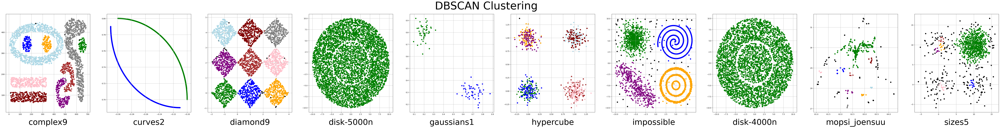

In [54]:
plt.figure(3)
plt.figure(3).suptitle('DBSCAN Clustering', fontsize=60)
plt.rcParams["figure.figsize"] = (100,10) 
# For complex9 Function 
plt.subplot(1,10,1)
renum_labels_dbscan_complex9=renum_label(model_dbscan_complex9.labels_,colormap)
plt.scatter(np_complex9[:,0],np_complex9[:,1],c= colormap[renum_labels_dbscan_complex9])
plt.title("complex9", fontsize=45, y=-0.14) 
plt.grid()
# For curves2 Function 
plt.subplot(1,10,2)
renum_labels_dbscan_curves2=renum_label(model_dbscan_curves2.labels_,colormap)
plt.scatter(np_curves2[:,0],np_curves2[:,1],c=colormap[renum_labels_dbscan_curves2])
plt.title("curves2", fontsize=45, y=-0.14) 
plt.grid()
# For diamond9 Function 
plt.subplot(1,10,3)
renum_labels_dbscan_diamond9=renum_label(model_dbscan_diamond9.labels_,colormap)
plt.scatter(np_diamond9[:,0],np_diamond9[:,1],c=colormap[renum_labels_dbscan_diamond9])
plt.title("diamond9", fontsize=45, y=-0.14) 
plt.grid()
# For disk-5000n Function 
plt.subplot(1,10,4)
renum_labels_dbscan_disk_5000n=renum_label(model_dbscan_disk_5000n.labels_,colormap)
plt.scatter(np_disk_5000n[:,0],np_disk_5000n[:,1],c=colormap[renum_labels_dbscan_disk_5000n])
plt.title("disk-5000n", fontsize=45, y=-0.14) 
plt.grid()
# For gaussians1 Function 
plt.subplot(1,10,5)
renum_labels_dbscan_gaussians1=renum_label(model_dbscan_gaussians1.labels_,colormap)
plt.scatter(np_gaussians1[:,0],np_gaussians1[:,1],c=colormap[renum_labels_dbscan_gaussians1])
plt.title("gaussians1", fontsize=45, y=-0.14) 
plt.grid()
# For hypercube Function 
plt.subplot(1,10,6)
renum_labels_dbscan_hypercube=renum_label(model_dbscan_hypercube.labels_,colormap)
plt.scatter(np_hypercube[:,0],np_hypercube[:,1],c=colormap[renum_labels_dbscan_hypercube])
plt.title("hypercube", fontsize=45, y=-0.14) 
plt.grid()
# For impossible Function 
plt.subplot(1,10,7)
renum_labels_dbscan_impossible=renum_label(model_dbscan_impossible.labels_,colormap)
plt.scatter(np_impossible[:,0],np_impossible[:,1],c=colormap[renum_labels_dbscan_impossible])
plt.title("impossible", fontsize=45, y=-0.14) 
plt.grid()
# For disk-4000n Function 
plt.subplot(1,10,8)
renum_labels_dbscan_disk_4000n=renum_label(model_dbscan_disk_4000n.labels_,colormap)
plt.scatter(np_disk_4000n[:,0],np_disk_4000n[:,1],c=colormap[renum_labels_dbscan_disk_4000n])
plt.title("disk-4000n", fontsize=45, y=-0.14) 
plt.grid()
# For mopsi-joensuu Function 
plt.subplot(1,10,9)
renum_labels_dbscan_mopsi_joensuu=renum_label(model_dbscan_mopsi_joensuu.labels_,colormap)
plt.scatter(np_mopsi_joensuu[:,0],np_mopsi_joensuu[:,1],c=colormap[renum_labels_dbscan_mopsi_joensuu])
plt.title("mopsi_joensuu", fontsize=45, y=-0.14) 
plt.grid()
# For sizes5 Function 
plt.subplot(1,10,10)
renum_labels_dbscan_sizes5=renum_label(model_dbscan_sizes5.labels_,colormap)
plt.scatter(np_sizes5[:,0],np_sizes5[:,1],c=colormap[renum_labels_dbscan_sizes5])
plt.title("sizes5", fontsize=45, y=-0.14) 
plt.grid()
# Save the plot
plt.savefig('DBSAN_scatter_plot.png')
plt.show() 

In [55]:
#MeanShift
from sklearn.cluster import MeanShift, estimate_bandwidth

In [56]:
bandwidth = estimate_bandwidth(np_complex9, quantile=0.2, n_samples=500)
model_ms_complex9 = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_complex9.fit(np_complex9)

MeanShift(bandwidth=152.8573074464274, bin_seeding=True)

In [57]:
bandwidth = estimate_bandwidth(np_curves2, quantile=0.2, n_samples=500)
model_ms_curves2 = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_curves2.fit(np_curves2)

MeanShift(bandwidth=0.03242378824730433, bin_seeding=True)

In [58]:
bandwidth = estimate_bandwidth(np_complex9, quantile=0.2, n_samples=500)
model_ms_complex9 = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_complex9.fit(np_complex9)

MeanShift(bandwidth=152.8573074464274, bin_seeding=True)

In [59]:
bandwidth = estimate_bandwidth(np_diamond9, quantile=0.2, n_samples=500)
model_ms_diamond9 = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_diamond9.fit(np_diamond9)

MeanShift(bandwidth=1.794119260719959, bin_seeding=True)

In [60]:
bandwidth = estimate_bandwidth(np_disk_5000n, quantile=0.2, n_samples=500)
model_ms_disk_5000n = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_disk_5000n.fit(np_disk_5000n)

MeanShift(bandwidth=5.216977423754994, bin_seeding=True)

In [61]:
bandwidth = estimate_bandwidth(np_gaussians1, quantile=0.2, n_samples=500)
model_ms_gaussians1 = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_gaussians1.fit(np_gaussians1)

MeanShift(bandwidth=0.07887041245354759, bin_seeding=True)

In [62]:
bandwidth = estimate_bandwidth(np_hypercube, quantile=0.2, n_samples=500)
model_ms_hypercube = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_hypercube.fit(np_hypercube)

MeanShift(bandwidth=1.0193900942867904, bin_seeding=True)

In [63]:
bandwidth = estimate_bandwidth(np_impossible, quantile=0.2, n_samples=500)
model_ms_impossible = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_impossible.fit(np_impossible)

MeanShift(bandwidth=4.3579963824674675, bin_seeding=True)

In [64]:
bandwidth = estimate_bandwidth(np_disk_4000n, quantile=0.2, n_samples=500)
model_ms_disk_4000n = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_disk_4000n.fit(np_disk_4000n)

MeanShift(bandwidth=5.208324131298618, bin_seeding=True)

In [65]:
bandwidth = estimate_bandwidth(np_mopsi_joensuu, quantile=0.2, n_samples=500)
model_ms_mopsi_joensuu = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_mopsi_joensuu.fit(np_mopsi_joensuu)

MeanShift(bandwidth=0.2527129771413546, bin_seeding=True)

In [66]:
bandwidth = estimate_bandwidth(np_sizes5, quantile=0.2, n_samples=500)
model_ms_sizes5 = MeanShift(bandwidth=bandwidth, bin_seeding=True)
model_ms_sizes5.fit(np_sizes5)

MeanShift(bandwidth=4.028172516218801, bin_seeding=True)

In [67]:
print("Dunn Index")

dunn_index_complex9 = dunn_idx(np_complex9,model_ms_complex9.labels_,model_ms_complex9.cluster_centers_,pairwise_distances(np_complex9))
print(f"Dunn Index of complex9: {dunn_index_complex9}")

dunn_index_curves2 = dunn_idx(np_curves2,model_ms_curves2.labels_,model_ms_curves2.cluster_centers_,pairwise_distances(np_curves2))
print(f"Dunn Index of curves2:  {dunn_index_curves2}")

dunn_index_diamond9 = dunn_idx(np_diamond9, model_ms_diamond9.labels_,model_ms_diamond9.cluster_centers_,pairwise_distances(np_diamond9))
print(f"Dunn Index of diamond9: {dunn_index_diamond9}")

dunn_index_disk_5000n = dunn_idx(np_disk_5000n,model_ms_disk_5000n.labels_,model_ms_disk_5000n.cluster_centers_,pairwise_distances(np_disk_5000n))
print(f"Dunn Index of disk-5000n:  {dunn_index_disk_5000n}")

dunn_index_gaussians1 = dunn_idx(np_gaussians1, model_ms_gaussians1.labels_,model_ms_gaussians1.cluster_centers_,pairwise_distances(np_gaussians1))
print(f"Dunn Index of gaussians1: {dunn_index_gaussians1}")

dunn_index_hypercube = dunn_idx(np_hypercube, model_ms_hypercube.labels_,model_ms_hypercube.cluster_centers_,pairwise_distances(np_hypercube))
print(f"Dunn Index of hypercube:  {dunn_index_hypercube}")

dunn_index_impossible = dunn_idx(np_impossible, model_ms_impossible.labels_,model_ms_impossible.cluster_centers_,pairwise_distances(np_impossible))
print(f"Dunn Index of impossible: {dunn_index_impossible}")

dunn_index_disk_4000n = dunn_idx(np_disk_4000n, model_ms_disk_4000n.labels_,model_ms_disk_4000n.cluster_centers_,pairwise_distances(np_disk_4000n))
print(f"Dunn Index of disk-4000n:  {dunn_index_disk_4000n}")

dunn_index_mopsi_joensuu = dunn_idx(np_mopsi_joensuu, model_ms_mopsi_joensuu.labels_,model_ms_mopsi_joensuu.cluster_centers_,pairwise_distances(np_mopsi_joensuu))
print(f"Dunn Index of mopsi_joensuu: {dunn_index_mopsi_joensuu}")

dunn_index_sizes5 = dunn_idx(np_sizes5, model_ms_sizes5.labels_,model_ms_sizes5.cluster_centers_,pairwise_distances(np_sizes5))
print(f"Dunn Index of sizes5:  {dunn_index_sizes5}")
print("\n")

print("Davies Bouldin Index")
db_index_complex9 = davies_bouldin_score(np_complex9, model_ms_complex9.labels_)
print(f"Davies-Bouldin Index of complex9: {db_index_complex9}")

db_index_curves2 = davies_bouldin_score(np_curves2, model_ms_curves2.labels_)
print(f"Davies-Bouldin Index of curves2:  {db_index_curves2}")

db_index_diamond9 = davies_bouldin_score(np_diamond9, model_ms_diamond9.labels_)
print(f"Davies-Bouldin Index of diamond9: {db_index_diamond9}")

db_index_disk_5000n = davies_bouldin_score(np_disk_5000n, model_ms_disk_5000n.labels_)
print(f"Davies-Bouldin Index of disk-5000n:  {db_index_disk_5000n}")

db_index_gaussians1 = davies_bouldin_score(np_gaussians1, model_ms_gaussians1.labels_)
print(f"Davies-Bouldin Index of gaussians1: {db_index_gaussians1}")

db_index_hypercube = davies_bouldin_score(np_hypercube, model_ms_hypercube.labels_)
print(f"Davies-Bouldin Index of hypercube:  {db_index_hypercube}")

db_index_impossible = davies_bouldin_score(np_impossible, model_ms_impossible.labels_)
print(f"Davies-Bouldin Index of impossible: {db_index_impossible}")

db_index_disk_4000n = davies_bouldin_score(np_disk_4000n, model_ms_disk_4000n.labels_)
print(f"Davies-Bouldin Indexof disk-4000n:  {db_index_disk_4000n}")

db_index_mopsi_joensuu = davies_bouldin_score(np_mopsi_joensuu, model_ms_mopsi_joensuu.labels_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {db_index_mopsi_joensuu}")

db_index_sizes5 = davies_bouldin_score(np_sizes5, model_ms_sizes5.labels_)
print(f"Davies-Bouldin Index of sizes5:  {db_index_sizes5}")
print("\n")

print("Xi-Beni Index")
xb_index_complex9 = Xi_Beni_idx(np_complex9, model_ms_complex9.labels_ ,model_ms_complex9.cluster_centers_)
print(f"Davies-Bouldin Index of complex9: {xb_index_complex9}")

xb_index_curves2 = Xi_Beni_idx(np_curves2, model_ms_curves2.labels_ , model_ms_curves2.cluster_centers_)
print(f"Davies-Bouldin Indexof curves2:  {xb_index_curves2}")

xb_index_diamond9 = Xi_Beni_idx(np_diamond9, model_ms_diamond9.labels_ ,model_ms_diamond9.cluster_centers_)
print(f"Davies-Bouldin Index of diamond9: {xb_index_diamond9}")

xb_index_disk_5000n = Xi_Beni_idx(np_disk_5000n, model_ms_disk_5000n.labels_ ,model_ms_disk_5000n.cluster_centers_)
print(f"Davies-Bouldin Indexof disk-5000n:  {xb_index_disk_5000n}")

xb_index_gaussians1 = Xi_Beni_idx(np_gaussians1, model_ms_gaussians1.labels_ ,model_ms_gaussians1.cluster_centers_)
print(f"Davies-Bouldin Index of gaussians1: {xb_index_gaussians1}")

xb_index_hypercube = Xi_Beni_idx(np_hypercube, model_ms_hypercube.labels_ ,model_ms_hypercube.cluster_centers_)
print(f"Davies-Bouldin Index of hypercube:  {xb_index_hypercube}")

xb_index_impossible = Xi_Beni_idx(np_impossible, model_ms_impossible.labels_ ,model_ms_impossible.cluster_centers_)
print(f"Davies-Bouldin Index of impossible: {xb_index_impossible}")

xb_index_disk_4000n = Xi_Beni_idx(np_disk_4000n, model_ms_disk_4000n.labels_ ,model_ms_disk_4000n.cluster_centers_)
print(f"Davies-Bouldin Index of disk-4000n:  {xb_index_disk_4000n}")

xb_index_mopsi_joensuu = Xi_Beni_idx(np_mopsi_joensuu, model_ms_mopsi_joensuu.labels_ ,model_ms_mopsi_joensuu.cluster_centers_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {xb_index_mopsi_joensuu}")

xb_index_sizes5 = Xi_Beni_idx(np_sizes5, model_ms_sizes5.labels_ ,model_ms_sizes5.cluster_centers_)
print(f"Davies-Bouldin Index of sizes5:  {xb_index_sizes5}")
print("\n")

print("Silhouette Score")
ss_index_complex9 = silhouette_score(np_complex9, model_ms_complex9.labels_ )
print(f"Silhouette Score of complex9: {ss_index_complex9}")

ss_index_curves2 = silhouette_score(np_curves2, model_ms_curves2.labels_ )
print(f"Silhouette Score of curves2:  {ss_index_curves2}")

ss_index_diamond9 = silhouette_score(np_diamond9, model_ms_diamond9.labels_ )
print(f"Silhouette Score  of diamond9: {ss_index_diamond9}")

ss_index_disk_5000n = silhouette_score(np_disk_5000n, model_ms_disk_5000n.labels_ )
print(f"Silhouette Score of disk-5000n:  {ss_index_disk_5000n}")

ss_index_gaussians1 = silhouette_score(np_gaussians1, model_ms_gaussians1.labels_ )
print(f"Silhouette Score  of gaussians1: {ss_index_gaussians1}")

ss_index_hypercube = silhouette_score(np_hypercube, model_ms_hypercube.labels_ )
print(f"Silhouette Score of hypercube:  {ss_index_hypercube}")

ss_index_impossible = silhouette_score(np_impossible, model_ms_impossible.labels_ )
print(f"Silhouette Score  of impossible: {ss_index_impossible}")

ss_index_disk_4000n = silhouette_score(np_disk_4000n, model_ms_disk_4000n.labels_ )
print(f"Silhouette Score of disk-4000n:  {ss_index_disk_4000n}")

ss_index_mopsi_joensuu = silhouette_score(np_mopsi_joensuu, model_ms_mopsi_joensuu.labels_ )
print(f"Silhouette Score of mopsi_joensuu: {ss_index_mopsi_joensuu}")

ss_index_sizes5 = silhouette_score(np_sizes5, model_ms_sizes5.labels_ )
print(f"Silhouette Score of sizes5:  {ss_index_sizes5}")

Dunn Index
Dunn Index of complex9: 0.569465272068484
Dunn Index of curves2:  0.45371726415384417
Dunn Index of diamond9: 0.6879033834244113
Dunn Index of disk-5000n:  0.594267349157076
Dunn Index of gaussians1: 0.09504763789898402
Dunn Index of hypercube:  0.23261975938182114
Dunn Index of impossible: 0.257373387458147
Dunn Index of disk-4000n:  0.6338193711411089
Dunn Index of mopsi_joensuu: 0.16074453667047736
Dunn Index of sizes5:  0.2700059106074782


Davies Bouldin Index
Davies-Bouldin Index of complex9: 0.8617360366541229
Davies-Bouldin Index of curves2:  0.6360570162447875
Davies-Bouldin Index of diamond9: 0.8080428802826516
Davies-Bouldin Index of disk-5000n:  0.8408939798899219
Davies-Bouldin Index of gaussians1: 0.19115128249343355
Davies-Bouldin Index of hypercube:  0.46461051167246437
Davies-Bouldin Index of impossible: 0.5424648768797146
Davies-Bouldin Indexof disk-4000n:  0.8502902262635039
Davies-Bouldin Index of mopsi_joensuu: 0.34813019435021825
Davies-Bouldin Index of

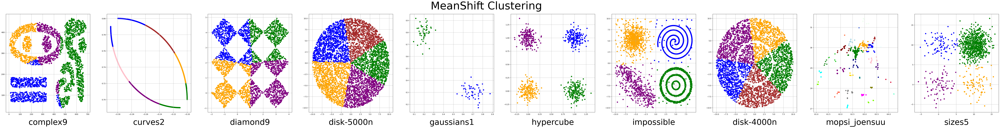

In [68]:
plt.figure(4)
plt.figure(4).suptitle('MeanShift Clustering', fontsize=60)
plt.rcParams["figure.figsize"] = (100,10) 
# For complex9 Function 
plt.subplot(1,10,1)
renum_labels_ms_complex9=renum_label(model_ms_complex9.labels_,colormap)
plt.scatter(np_complex9[:,0],np_complex9[:,1],c= colormap[renum_labels_ms_complex9])
plt.title("complex9", fontsize=45, y=-0.14) 
plt.grid()
# For curves2 Function 
plt.subplot(1,10,2)
renum_labels_ms_curves2=renum_label(model_ms_curves2.labels_,colormap)
plt.scatter(np_curves2[:,0],np_curves2[:,1],c=colormap[renum_labels_ms_curves2])
plt.title("curves2", fontsize=45, y=-0.14) 
plt.grid()
# For diamond9 Function 
plt.subplot(1,10,3)
renum_labels_ms_diamond9=renum_label(model_ms_diamond9.labels_,colormap)
plt.scatter(np_diamond9[:,0],np_diamond9[:,1],c=colormap[renum_labels_ms_diamond9])
plt.title("diamond9", fontsize=45, y=-0.14) 
plt.grid()
# For disk-5000n Function 
plt.subplot(1,10,4)
renum_labels_ms_disk_5000n=renum_label(model_ms_disk_5000n.labels_,colormap)
plt.scatter(np_disk_5000n[:,0],np_disk_5000n[:,1],c=colormap[renum_labels_ms_disk_5000n])
plt.title("disk-5000n", fontsize=45, y=-0.14) 
plt.grid()
# For gaussians1 Function 
plt.subplot(1,10,5)
renum_labels_ms_gaussians1=renum_label(model_ms_gaussians1.labels_,colormap)
plt.scatter(np_gaussians1[:,0],np_gaussians1[:,1],c=colormap[renum_labels_ms_gaussians1])
plt.title("gaussians1", fontsize=45, y=-0.14) 
plt.grid()
# For hypercube Function 
plt.subplot(1,10,6)
renum_labels_ms_hypercube=renum_label(model_ms_hypercube.labels_,colormap)
plt.scatter(np_hypercube[:,0],np_hypercube[:,1],c=colormap[renum_labels_ms_hypercube])
plt.title("hypercube", fontsize=45, y=-0.14) 
plt.grid()
# For impossible Function 
plt.subplot(1,10,7)
renum_labels_ms_impossible=renum_label(model_ms_impossible.labels_,colormap)
plt.scatter(np_impossible[:,0],np_impossible[:,1],c=colormap[renum_labels_ms_impossible])
plt.title("impossible", fontsize=45, y=-0.14) 
plt.grid()
# For disk-4000n Function 
plt.subplot(1,10,8)
renum_labels_ms_disk_4000n=renum_label(model_ms_disk_4000n.labels_,colormap)
plt.scatter(np_disk_4000n[:,0],np_disk_4000n[:,1],c=colormap[renum_labels_ms_disk_4000n])
plt.title("disk-4000n", fontsize=45, y=-0.14) 
plt.grid()
# For mopsi-joensuu Function 
plt.subplot(1,10,9)
renum_labels_ms_mopsi_joensuu=renum_label(model_ms_mopsi_joensuu.labels_,colormap)
plt.scatter(np_mopsi_joensuu[:,0],np_mopsi_joensuu[:,1],c=colormap[renum_labels_ms_mopsi_joensuu])
plt.title("mopsi_joensuu", fontsize=45, y=-0.14) 
plt.grid()
# For sizes5 Function 
plt.subplot(1,10,10)
renum_labels_ms_sizes5=renum_label(model_ms_sizes5.labels_,colormap)
plt.scatter(np_sizes5[:,0],np_sizes5[:,1],c=colormap[renum_labels_ms_sizes5])
plt.title("sizes5", fontsize=45, y=-0.14) 
plt.grid()
# Save the plot
plt.savefig('MeanShift_scatter_plot.png')
plt.show() 

In [69]:
#AgglomerativeClustering
from sklearn.cluster import AgglomerativeClustering

In [70]:
model_ag_complex9 = AgglomerativeClustering(n_clusters=4).fit(np_complex9)

In [71]:
model_ag_curves2 = AgglomerativeClustering(n_clusters=4).fit(np_curves2)

In [72]:
model_ag_diamond9 = AgglomerativeClustering(n_clusters=9).fit(np_diamond9)

In [73]:
model_ag_disk_5000n = AgglomerativeClustering(n_clusters=4).fit(np_disk_5000n)

In [74]:
model_ag_gaussians1 = AgglomerativeClustering(n_clusters=4).fit(np_gaussians1)

In [75]:
model_ag_hypercube = AgglomerativeClustering(n_clusters=4).fit(np_hypercube)

In [76]:
model_ag_impossible = AgglomerativeClustering(n_clusters=4).fit(np_impossible)

In [77]:
model_ag_disk_4000n = AgglomerativeClustering(n_clusters=4).fit(np_disk_4000n)

In [78]:
model_ag_mopsi_joensuu = AgglomerativeClustering(n_clusters=4).fit(np_mopsi_joensuu)

In [79]:
model_ag_sizes5 = AgglomerativeClustering(n_clusters=4).fit(np_sizes5)

In [81]:
'''
print("Dunn Index")

dunn_index_complex9 = dunn_idx(np_complex9,model_ag_complex9.labels_,model_ag_complex9.cluster_centers_,pairwise_distances(np_complex9))
print(f"Dunn Index of complex9: {dunn_index_complex9}")

dunn_index_curves2 = dunn_idx(np_curves2,model_ag_curves2.labels_,model_ag_curves2.cluster_centers_,pairwise_distances(np_curves2))
print(f"Dunn Index of curves2:  {dunn_index_curves2}")

dunn_index_diamond9 = dunn_idx(np_diamond9, model_ag_diamond9.labels_,model_ag_diamond9.cluster_centers_,pairwise_distances(np_diamond9))
print(f"Dunn Index of diamond9: {dunn_index_diamond9}")

dunn_index_disk_5000n = dunn_idx(np_disk_5000n,model_ag_disk_5000n.labels_,model_ag_disk_5000n.cluster_centers_,pairwise_distances(np_disk_5000n))
print(f"Dunn Index of disk-5000n:  {dunn_index_disk_5000n}")

dunn_index_gaussians1 = dunn_idx(np_gaussians1, model_ag_gaussians1.labels_,model_ag_gaussians1.cluster_centers_,pairwise_distances(np_gaussians1))
print(f"Dunn Index of gaussians1: {dunn_index_gaussians1}")

dunn_index_hypercube = dunn_idx(np_hypercube, model_ag_hypercube.labels_,model_ag_hypercube.cluster_centers_,pairwise_distances(np_hypercube))
print(f"Dunn Index of hypercube:  {dunn_index_hypercube}")

dunn_index_impossible = dunn_idx(np_impossible, model_ag_impossible.labels_,model_ag_impossible.cluster_centers_,pairwise_distances(np_impossible))
print(f"Dunn Index of impossible: {dunn_index_impossible}")

dunn_index_disk_4000n = dunn_idx(np_disk_4000n, model_ag_disk_4000n.labels_,model_ag_disk_4000n.cluster_centers_,pairwise_distances(np_disk_4000n))
print(f"Dunn Index of disk-4000n:  {dunn_index_disk_4000n}")

dunn_index_mopsi_joensuu = dunn_idx(np_mopsi_joensuu, model_ag_mopsi_joensuu.labels_,model_ag_mopsi_joensuu.cluster_centers_,pairwise_distances(np_mopsi_joensuu))
print(f"Dunn Index of mopsi_joensuu: {dunn_index_mopsi_joensuu}")

dunn_index_sizes5 = dunn_idx(np_sizes5, model_ag_sizes5.labels_,model_ag_sizes5.cluster_centers_,pairwise_distances(np_sizes5))
print(f"Dunn Index of sizes5:  {dunn_index_sizes5}")
print("\n")
'''

print("Davies Bouldin Index")
db_index_complex9 = davies_bouldin_score(np_complex9, model_ag_complex9.labels_)
print(f"Davies-Bouldin Index of complex9: {db_index_complex9}")

db_index_curves2 = davies_bouldin_score(np_curves2, model_ag_curves2.labels_)
print(f"Davies-Bouldin Index of curves2:  {db_index_curves2}")

db_index_diamond9 = davies_bouldin_score(np_diamond9, model_ag_diamond9.labels_)
print(f"Davies-Bouldin Index of diamond9: {db_index_diamond9}")

db_index_disk_5000n = davies_bouldin_score(np_disk_5000n, model_ag_disk_5000n.labels_)
print(f"Davies-Bouldin Index of disk-5000n:  {db_index_disk_5000n}")

db_index_gaussians1 = davies_bouldin_score(np_gaussians1, model_ag_gaussians1.labels_)
print(f"Davies-Bouldin Index of gaussians1: {db_index_gaussians1}")

db_index_hypercube = davies_bouldin_score(np_hypercube, model_ag_hypercube.labels_)
print(f"Davies-Bouldin Index of hypercube:  {db_index_hypercube}")

db_index_impossible = davies_bouldin_score(np_impossible, model_ag_impossible.labels_)
print(f"Davies-Bouldin Index of impossible: {db_index_impossible}")

db_index_disk_4000n = davies_bouldin_score(np_disk_4000n, model_ag_disk_4000n.labels_)
print(f"Davies-Bouldin Indexof disk-4000n:  {db_index_disk_4000n}")

db_index_mopsi_joensuu = davies_bouldin_score(np_mopsi_joensuu, model_ag_mopsi_joensuu.labels_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {db_index_mopsi_joensuu}")

db_index_sizes5 = davies_bouldin_score(np_sizes5, model_ag_sizes5.labels_)
print(f"Davies-Bouldin Index of sizes5:  {db_index_sizes5}")
print("\n")
'''
print("Xi-Beni Index")
xb_index_complex9 = Xi_Beni_idx(np_complex9, model_ag_complex9.labels_ ,model_ag_complex9.cluster_centers_)
print(f"Davies-Bouldin Index of complex9: {xb_index_complex9}")

xb_index_curves2 = Xi_Beni_idx(np_curves2, model_ag_curves2.labels_ , model_ag_curves2.cluster_centers_)
print(f"Davies-Bouldin Indexof curves2:  {xb_index_curves2}")

xb_index_diamond9 = Xi_Beni_idx(np_diamond9, model_ag_diamond9.labels_ ,model_ag_diamond9.cluster_centers_)
print(f"Davies-Bouldin Index of diamond9: {xb_index_diamond9}")

xb_index_disk_5000n = Xi_Beni_idx(np_disk_5000n, model_ag_disk_5000n.labels_ ,model_ag_disk_5000n.cluster_centers_)
print(f"Davies-Bouldin Indexof disk-5000n:  {xb_index_disk_5000n}")

xb_index_gaussians1 = Xi_Beni_idx(np_gaussians1, model_ag_gaussians1.labels_ ,model_ag_gaussians1.cluster_centers_)
print(f"Davies-Bouldin Index of gaussians1: {xb_index_gaussians1}")

xb_index_hypercube = Xi_Beni_idx(np_hypercube, model_ag_hypercube.labels_ ,model_ag_hypercube.cluster_centers_)
print(f"Davies-Bouldin Index of hypercube:  {xb_index_hypercube}")

xb_index_impossible = Xi_Beni_idx(np_impossible, model_ag_impossible.labels_ ,model_ag_impossible.cluster_centers_)
print(f"Davies-Bouldin Index of impossible: {xb_index_impossible}")

xb_index_disk_4000n = Xi_Beni_idx(np_disk_4000n, model_ag_disk_4000n.labels_ ,model_ag_disk_4000n.cluster_centers_)
print(f"Davies-Bouldin Index of disk-4000n:  {xb_index_disk_4000n}")

xb_index_mopsi_joensuu = Xi_Beni_idx(np_mopsi_joensuu, model_ag_mopsi_joensuu.labels_ ,model_ag_mopsi_joensuu.cluster_centers_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {xb_index_mopsi_joensuu}")

xb_index_sizes5 = Xi_Beni_idx(np_sizes5, model_ag_sizes5.labels_ ,model_ag_sizes5.cluster_centers_)
print(f"Davies-Bouldin Index of sizes5:  {xb_index_sizes5}")
print("\n")
'''

print("Silhouette Score")
ss_index_complex9 = silhouette_score(np_complex9, model_ag_complex9.labels_ )
print(f"Silhouette Score of complex9: {ss_index_complex9}")

ss_index_curves2 = silhouette_score(np_curves2, model_ag_curves2.labels_ )
print(f"Silhouette Score of curves2:  {ss_index_curves2}")

ss_index_diamond9 = silhouette_score(np_diamond9, model_ag_diamond9.labels_ )
print(f"Silhouette Score  of diamond9: {ss_index_diamond9}")

ss_index_disk_5000n = silhouette_score(np_disk_5000n, model_ag_disk_5000n.labels_ )
print(f"Silhouette Score of disk-5000n:  {ss_index_disk_5000n}")

ss_index_gaussians1 = silhouette_score(np_gaussians1, model_ag_gaussians1.labels_ )
print(f"Silhouette Score  of gaussians1: {ss_index_gaussians1}")

ss_index_hypercube = silhouette_score(np_hypercube, model_ag_hypercube.labels_ )
print(f"Silhouette Score of hypercube:  {ss_index_hypercube}")

ss_index_impossible = silhouette_score(np_impossible, model_ag_impossible.labels_ )
print(f"Silhouette Score  of impossible: {ss_index_impossible}")

ss_index_disk_4000n = silhouette_score(np_disk_4000n, model_ag_disk_4000n.labels_ )
print(f"Silhouette Score of disk-4000n:  {ss_index_disk_4000n}")

ss_index_mopsi_joensuu = silhouette_score(np_mopsi_joensuu, model_ag_mopsi_joensuu.labels_ )
print(f"Silhouette Score of mopsi_joensuu: {ss_index_mopsi_joensuu}")

ss_index_sizes5 = silhouette_score(np_sizes5, model_ag_sizes5.labels_ )
print(f"Silhouette Score of sizes5:  {ss_index_sizes5}")

Davies Bouldin Index
Davies-Bouldin Index of complex9: 0.9087266809406456
Davies-Bouldin Index of curves2:  0.7327293404372579
Davies-Bouldin Index of diamond9: 0.5543846408299329
Davies-Bouldin Index of disk-5000n:  1.1016664223190353
Davies-Bouldin Index of gaussians1: 0.976636946001173
Davies-Bouldin Index of hypercube:  0.46461051167246437
Davies-Bouldin Index of impossible: 0.5427414381937365
Davies-Bouldin Indexof disk-4000n:  0.9251841190370376
Davies-Bouldin Index of mopsi_joensuu: 0.5643430184923444
Davies-Bouldin Index of sizes5:  0.49662997862204267


Silhouette Score
Silhouette Score of complex9: 0.39904246474877125
Silhouette Score of curves2:  0.44213677601925383
Silhouette Score  of diamond9: 0.5479013817001807
Silhouette Score of disk-5000n:  0.31045653659406336
Silhouette Score  of gaussians1: 0.37679213284844343
Silhouette Score of hypercube:  0.7093631318979685
Silhouette Score  of impossible: 0.6097733926753595
Silhouette Score of disk-4000n:  0.3125734792692051
Sil

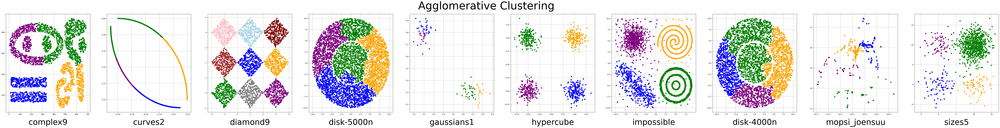

In [82]:
plt.figure(5)
plt.figure(5).suptitle('Agglomerative Clustering', fontsize=60)
plt.rcParams["figure.figsize"] = (100,10) 
# For complex9 Function 
plt.subplot(1,10,1)
renum_labels_ag_complex9=renum_label(model_ag_complex9.labels_,colormap)
plt.scatter(np_complex9[:,0],np_complex9[:,1],c= colormap[renum_labels_ag_complex9])
plt.title("complex9", fontsize=45, y=-0.14) 
plt.grid()
# For curves2 Function 
plt.subplot(1,10,2)
renum_labels_ag_curves2=renum_label(model_ag_curves2.labels_,colormap)
plt.scatter(np_curves2[:,0],np_curves2[:,1],c=colormap[renum_labels_ag_curves2])
plt.title("curves2", fontsize=45, y=-0.14) 
plt.grid()
# For diamond9 Function 
plt.subplot(1,10,3)
renum_labels_ag_diamond9=renum_label(model_ag_diamond9.labels_,colormap)
plt.scatter(np_diamond9[:,0],np_diamond9[:,1],c=colormap[renum_labels_ag_diamond9])
plt.title("diamond9", fontsize=45, y=-0.14) 
plt.grid()
# For disk-5000n Function 
plt.subplot(1,10,4)
renum_labels_ag_disk_5000n=renum_label(model_ag_disk_5000n.labels_,colormap)
plt.scatter(np_disk_5000n[:,0],np_disk_5000n[:,1],c=colormap[renum_labels_ag_disk_5000n])
plt.title("disk-5000n", fontsize=45, y=-0.14) 
plt.grid()
# For gaussians1 Function 
plt.subplot(1,10,5)
renum_labels_ag_gaussians1=renum_label(model_ag_gaussians1.labels_,colormap)
plt.scatter(np_gaussians1[:,0],np_gaussians1[:,1],c=colormap[renum_labels_ag_gaussians1])
plt.title("gaussians1", fontsize=45, y=-0.14) 
plt.grid()
# For hypercube Function 
plt.subplot(1,10,6)
renum_labels_ag_hypercube=renum_label(model_ag_hypercube.labels_,colormap)
plt.scatter(np_hypercube[:,0],np_hypercube[:,1],c=colormap[renum_labels_ag_hypercube])
plt.title("hypercube", fontsize=45, y=-0.14) 
plt.grid()
# For impossible Function 
plt.subplot(1,10,7)
renum_labels_ag_impossible=renum_label(model_ag_impossible.labels_,colormap)
plt.scatter(np_impossible[:,0],np_impossible[:,1],c=colormap[renum_labels_ag_impossible])
plt.title("impossible", fontsize=45, y=-0.14) 
plt.grid()
# For disk-4000n Function 
plt.subplot(1,10,8)
renum_labels_ag_disk_4000n=renum_label(model_ag_disk_4000n.labels_,colormap)
plt.scatter(np_disk_4000n[:,0],np_disk_4000n[:,1],c=colormap[renum_labels_ag_disk_4000n])
plt.title("disk-4000n", fontsize=45, y=-0.14) 
plt.grid()
# For mopsi-joensuu Function 
plt.subplot(1,10,9)
renum_labels_ag_mopsi_joensuu=renum_label(model_ag_mopsi_joensuu.labels_,colormap)
plt.scatter(np_mopsi_joensuu[:,0],np_mopsi_joensuu[:,1],c=colormap[renum_labels_ag_mopsi_joensuu])
plt.title("mopsi_joensuu", fontsize=45, y=-0.14) 
plt.grid()
# For sizes5 Function 
plt.subplot(1,10,10)
renum_labels_ag_sizes5=renum_label(model_ag_sizes5.labels_,colormap)
plt.scatter(np_sizes5[:,0],np_sizes5[:,1],c=colormap[renum_labels_ag_sizes5])
plt.title("sizes5", fontsize=45, y=-0.14) 
plt.grid()
# Save the plot
plt.savefig('Agglomerative_Clustering_scatter_plot.png')
plt.show() 

In [83]:
#OPTICS
from sklearn.cluster import OPTICS, cluster_optics_dbscan

In [84]:
model_opt_complex9 = OPTICS(min_samples=10, xi=0.2, min_cluster_size=0.10).fit(np_complex9)


In [85]:
model_opt_curves2 = OPTICS(min_samples=10, xi=0.05, min_cluster_size=0.015).fit(np_curves2)


In [86]:
model_opt_diamond9 = OPTICS(min_samples=10, xi=0.015, min_cluster_size=0.1).fit(np_diamond9)


In [87]:
model_opt_disk_5000n = OPTICS(min_samples=10, xi=0.02, min_cluster_size=0.1).fit(np_disk_5000n)


In [88]:
model_opt_gaussians1 = OPTICS(min_samples=10, xi=0.15, min_cluster_size=0.1).fit(np_gaussians1)


In [89]:
model_opt_hypercube = OPTICS(min_samples=10, xi=0.2, min_cluster_size=0.1).fit(np_hypercube)


In [90]:
model_opt_impossible = OPTICS(min_samples=10, xi=0.2, min_cluster_size=0.1).fit(np_impossible)


In [91]:
model_opt_disk_4000n = OPTICS(min_samples=10, xi=0.025, min_cluster_size=0.1).fit(np_disk_4000n)


In [92]:
model_opt_mopsi_joensuu = OPTICS(min_samples=10, xi=0.05, min_cluster_size=0.01).fit(np_mopsi_joensuu)


/home/clan-nur/.local/lib/python3.8/site-packages/sklearn/cluster/_optics.py:995: RuntimeWarning: divide by zero encountered in divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


In [93]:
model_opt_sizes5 = OPTICS(min_samples=10, xi=0.05, min_cluster_size=0.015).fit(np_sizes5)


In [96]:
'''
print("Dunn Index")

dunn_index_complex9 = dunn_idx(np_complex9,model_opt_complex9.labels_,model_opt_complex9.cluster_centers_,pairwise_distances(np_complex9))
print(f"Dunn Index of complex9: {dunn_index_complex9}")

dunn_index_curves2 = dunn_idx(np_curves2,model_opt_curves2.labels_,model_opt_curves2.cluster_centers_,pairwise_distances(np_curves2))
print(f"Dunn Index of curves2:  {dunn_index_curves2}")

dunn_index_diamond9 = dunn_idx(np_diamond9, model_opt_diamond9.labels_,model_opt_diamond9.cluster_centers_,pairwise_distances(np_diamond9))
print(f"Dunn Index of diamond9: {dunn_index_diamond9}")

dunn_index_disk_5000n = dunn_idx(np_disk_5000n,model_opt_disk_5000n.labels_,model_opt_disk_5000n.cluster_centers_,pairwise_distances(np_disk_5000n))
print(f"Dunn Index of disk-5000n:  {dunn_index_disk_5000n}")

dunn_index_gaussians1 = dunn_idx(np_gaussians1, model_opt_gaussians1.labels_,model_opt_gaussians1.cluster_centers_,pairwise_distances(np_gaussians1))
print(f"Dunn Index of gaussians1: {dunn_index_gaussians1}")

dunn_index_hypercube = dunn_idx(np_hypercube, model_opt_hypercube.labels_,model_opt_hypercube.cluster_centers_,pairwise_distances(np_hypercube))
print(f"Dunn Index of hypercube:  {dunn_index_hypercube}")

dunn_index_impossible = dunn_idx(np_impossible, model_opt_impossible.labels_,model_opt_impossible.cluster_centers_,pairwise_distances(np_impossible))
print(f"Dunn Index of impossible: {dunn_index_impossible}")

dunn_index_disk_4000n = dunn_idx(np_disk_4000n, model_opt_disk_4000n.labels_,model_opt_disk_4000n.cluster_centers_,pairwise_distances(np_disk_4000n))
print(f"Dunn Index of disk-4000n:  {dunn_index_disk_4000n}")

dunn_index_mopsi_joensuu = dunn_idx(np_mopsi_joensuu, model_opt_mopsi_joensuu.labels_,model_opt_mopsi_joensuu.cluster_centers_,pairwise_distances(np_mopsi_joensuu))
print(f"Dunn Index of mopsi_joensuu: {dunn_index_mopsi_joensuu}")

dunn_index_sizes5 = dunn_idx(np_sizes5, model_opt_sizes5.labels_,model_opt_sizes5.cluster_centers_,pairwise_distances(np_sizes5))
print(f"Dunn Index of sizes5:  {dunn_index_sizes5}")
print("\n")
'''
print("Davies Bouldin Index")
db_index_complex9 = davies_bouldin_score(np_complex9, model_opt_complex9.labels_)
print(f"Davies-Bouldin Index of complex9: {db_index_complex9}")

db_index_curves2 = davies_bouldin_score(np_curves2, model_opt_curves2.labels_)
print(f"Davies-Bouldin Index of curves2:  {db_index_curves2}")

db_index_diamond9 = davies_bouldin_score(np_diamond9, model_opt_diamond9.labels_)
print(f"Davies-Bouldin Index of diamond9: {db_index_diamond9}")

#db_index_disk_5000n = davies_bouldin_score(np_disk_5000n, model_opt_disk_5000n.labels_)
#print(f"Davies-Bouldin Index of disk-5000n:  {db_index_disk_5000n}")

db_index_gaussians1 = davies_bouldin_score(np_gaussians1, model_opt_gaussians1.labels_)
print(f"Davies-Bouldin Index of gaussians1: {db_index_gaussians1}")

db_index_hypercube = davies_bouldin_score(np_hypercube, model_opt_hypercube.labels_)
print(f"Davies-Bouldin Index of hypercube:  {db_index_hypercube}")

db_index_impossible = davies_bouldin_score(np_impossible, model_opt_impossible.labels_)
print(f"Davies-Bouldin Index of impossible: {db_index_impossible}")

db_index_disk_4000n = davies_bouldin_score(np_disk_4000n, model_opt_disk_4000n.labels_)
print(f"Davies-Bouldin Indexof disk-4000n:  {db_index_disk_4000n}")

db_index_mopsi_joensuu = davies_bouldin_score(np_mopsi_joensuu, model_opt_mopsi_joensuu.labels_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {db_index_mopsi_joensuu}")

db_index_sizes5 = davies_bouldin_score(np_sizes5, model_opt_sizes5.labels_)
print(f"Davies-Bouldin Index of sizes5:  {db_index_sizes5}")
print("\n")
'''
print("Xi-Beni Index")
xb_index_complex9 = Xi_Beni_idx(np_complex9, model_opt_complex9.labels_ ,model_opt_complex9.cluster_centers_)
print(f"Davies-Bouldin Index of complex9: {xb_index_complex9}")

xb_index_curves2 = Xi_Beni_idx(np_curves2, model_opt_curves2.labels_ , model_opt_curves2.cluster_centers_)
print(f"Davies-Bouldin Indexof curves2:  {xb_index_curves2}")

xb_index_diamond9 = Xi_Beni_idx(np_diamond9, model_opt_diamond9.labels_ ,model_opt_diamond9.cluster_centers_)
print(f"Davies-Bouldin Index of diamond9: {xb_index_diamond9}")

xb_index_disk_5000n = Xi_Beni_idx(np_disk_5000n, model_opt_disk_5000n.labels_ ,model_opt_disk_5000n.cluster_centers_)
print(f"Davies-Bouldin Indexof disk-5000n:  {xb_index_disk_5000n}")

xb_index_gaussians1 = Xi_Beni_idx(np_gaussians1, model_opt_gaussians1.labels_ ,model_opt_gaussians1.cluster_centers_)
print(f"Davies-Bouldin Index of gaussians1: {xb_index_gaussians1}")

xb_index_hypercube = Xi_Beni_idx(np_hypercube, model_opt_hypercube.labels_ ,model_opt_hypercube.cluster_centers_)
print(f"Davies-Bouldin Index of hypercube:  {xb_index_hypercube}")

xb_index_impossible = Xi_Beni_idx(np_impossible, model_opt_impossible.labels_ ,model_opt_impossible.cluster_centers_)
print(f"Davies-Bouldin Index of impossible: {xb_index_impossible}")

xb_index_disk_4000n = Xi_Beni_idx(np_disk_4000n, model_opt_disk_4000n.labels_ ,model_opt_disk_4000n.cluster_centers_)
print(f"Davies-Bouldin Index of disk-4000n:  {xb_index_disk_4000n}")

xb_index_mopsi_joensuu = Xi_Beni_idx(np_mopsi_joensuu, model_opt_mopsi_joensuu.labels_ ,model_opt_mopsi_joensuu.cluster_centers_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {xb_index_mopsi_joensuu}")

xb_index_sizes5 = Xi_Beni_idx(np_sizes5, model_opt_sizes5.labels_ ,model_opt_sizes5.cluster_centers_)
print(f"Davies-Bouldin Index of sizes5:  {xb_index_sizes5}")
print("\n")
'''

print("Silhouette Score")
ss_index_complex9 = silhouette_score(np_complex9, model_opt_complex9.labels_ )
print(f"Silhouette Score of complex9: {ss_index_complex9}")

ss_index_curves2 = silhouette_score(np_curves2, model_opt_curves2.labels_ )
print(f"Silhouette Score of curves2:  {ss_index_curves2}")

ss_index_diamond9 = silhouette_score(np_diamond9, model_opt_diamond9.labels_ )
print(f"Silhouette Score  of diamond9: {ss_index_diamond9}")

#ss_index_disk_5000n = silhouette_score(np_disk_5000n, model_opt_disk_5000n.labels_ )
#print(f"Silhouette Score of disk-5000n:  {ss_index_disk_5000n}")

ss_index_gaussians1 = silhouette_score(np_gaussians1, model_opt_gaussians1.labels_ )
print(f"Silhouette Score  of gaussians1: {ss_index_gaussians1}")

ss_index_hypercube = silhouette_score(np_hypercube, model_opt_hypercube.labels_ )
print(f"Silhouette Score of hypercube:  {ss_index_hypercube}")

ss_index_impossible = silhouette_score(np_impossible, model_opt_impossible.labels_ )
print(f"Silhouette Score  of impossible: {ss_index_impossible}")

ss_index_disk_4000n = silhouette_score(np_disk_4000n, model_opt_disk_4000n.labels_ )
print(f"Silhouette Score of disk-4000n:  {ss_index_disk_4000n}")

ss_index_mopsi_joensuu = silhouette_score(np_mopsi_joensuu, model_opt_mopsi_joensuu.labels_ )
print(f"Silhouette Score of mopsi_joensuu: {ss_index_mopsi_joensuu}")

ss_index_sizes5 = silhouette_score(np_sizes5, model_opt_sizes5.labels_ )
print(f"Silhouette Score of sizes5:  {ss_index_sizes5}")

Davies Bouldin Index
Davies-Bouldin Index of complex9: 1.863159514594156
Davies-Bouldin Index of curves2:  1.4750916250337307
Davies-Bouldin Index of diamond9: 1.7874248720105457
Davies-Bouldin Index of gaussians1: 0.19115128249343355
Davies-Bouldin Index of hypercube:  0.24741224334312195
Davies-Bouldin Index of impossible: 46.75117329493932
Davies-Bouldin Indexof disk-4000n:  126.07752427454254
Davies-Bouldin Index of mopsi_joensuu: 2.1035415809503633
Davies-Bouldin Index of sizes5:  3.0334901852701606


Silhouette Score
Silhouette Score of complex9: 0.15807653851462714
Silhouette Score of curves2:  0.34757165505280113
Silhouette Score  of diamond9: 0.5433073589270281
Silhouette Score  of gaussians1: 0.8613276990526753
Silhouette Score of hypercube:  0.8276765656885965
Silhouette Score  of impossible: 0.20195090687969167
Silhouette Score of disk-4000n:  -0.06456280534071593
Silhouette Score of mopsi_joensuu: -0.20250679241381686
Silhouette Score of sizes5:  -0.28068993354820104


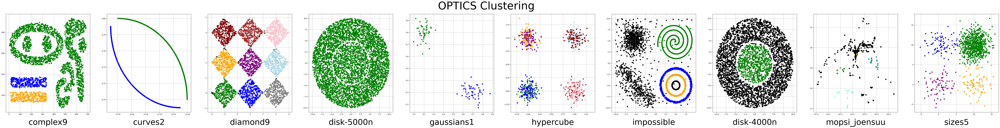

In [97]:
plt.figure(5)
plt.figure(5).suptitle('OPTICS Clustering', fontsize=60)
plt.rcParams["figure.figsize"] = (100,10) 
# For complex9 Function 
plt.subplot(1,10,1)
renum_labels_opt_complex9=renum_label(model_opt_complex9.labels_,colormap)
plt.scatter(np_complex9[:,0],np_complex9[:,1],c= colormap[renum_labels_opt_complex9])
plt.title("complex9", fontsize=45, y=-0.14) 
plt.grid()
# For curves2 Function from sklearn import metrics
plt.subplot(1,10,2)
renum_labels_opt_curves2=renum_label(model_opt_curves2.labels_,colormap)
plt.scatter(np_curves2[:,0],np_curves2[:,1],c=colormap[renum_labels_opt_curves2])
plt.title("curves2", fontsize=45, y=-0.14) 
plt.grid()
# For diamond9 Function 
plt.subplot(1,10,3)
renum_labels_opt_diamond9=renum_label(model_opt_diamond9.labels_,colormap)
plt.scatter(np_diamond9[:,0],np_diamond9[:,1],c=colormap[renum_labels_opt_diamond9])
plt.title("diamond9", fontsize=45, y=-0.14) 
plt.grid()
# For disk-5000n Function 
plt.subplot(1,10,4)
renum_labels_opt_disk_5000n=renum_label(model_opt_disk_5000n.labels_,colormap)
plt.scatter(np_disk_5000n[:,0],np_disk_5000n[:,1],c=colormap[renum_labels_opt_disk_5000n])
plt.title("disk-5000n", fontsize=45, y=-0.14) 
plt.grid()
# For gaussians1 Function 
plt.subplot(1,10,5)
renum_labels_opt_gaussians1=renum_label(model_opt_gaussians1.labels_,colormap)
plt.scatter(np_gaussians1[:,0],np_gaussians1[:,1],c=colormap[renum_labels_opt_gaussians1])
plt.title("gaussians1", fontsize=45, y=-0.14) 
plt.grid()
# For hypercube Function 
plt.subplot(1,10,6)
renum_labels_opt_hypercube=renum_label(model_opt_hypercube.labels_,colormap)
plt.scatter(np_hypercube[:,0],np_hypercube[:,1],c=colormap[renum_labels_opt_hypercube])
plt.title("hypercube", fontsize=45, y=-0.14) 
plt.grid()
# For impossible Function 
plt.subplot(1,10,7)
renum_labels_opt_impossible=renum_label(model_opt_impossible.labels_,colormap)
plt.scatter(np_impossible[:,0],np_impossible[:,1],c=colormap[renum_labels_opt_impossible])
plt.title("impossible", fontsize=45, y=-0.14) 
plt.grid()
# For disk-4000n Function 
plt.subplot(1,10,8)
renum_labels_opt_disk_4000n=renum_label(model_opt_disk_4000n.labels_,colormap)
plt.scatter(np_disk_4000n[:,0],np_disk_4000n[:,1],c=colormap[renum_labels_opt_disk_4000n])
plt.title("disk-4000n", fontsize=45, y=-0.14) 
plt.grid()
# For mopsi-joensuu Function 
plt.subplot(1,10,9)
renum_labels_opt_mopsi_joensuu=renum_label(model_opt_mopsi_joensuu.labels_,colormap)
plt.scatter(np_mopsi_joensuu[:,0],np_mopsi_joensuu[:,1],c=colormap[renum_labels_opt_mopsi_joensuu])
plt.title("mopsi_joensuu", fontsize=45, y=-0.14) 
plt.grid()
# For sizes5 Function 
plt.subplot(1,10,10)
renum_labels_opt_sizes5=renum_label(model_opt_sizes5.labels_,colormap)
plt.scatter(np_sizes5[:,0],np_sizes5[:,1],c=colormap[renum_labels_ms_sizes5])
plt.title("sizes5", fontsize=45, y=-0.14) 
plt.grid()
# Save the plot
plt.savefig('OPTICS_Clustering_scatter_plot.png')
plt.show() 

In [98]:
#HDBSCAN
from sklearn.cluster import HDBSCAN

In [99]:
model_hdb_complex9 = HDBSCAN(min_cluster_size=8,min_samples=40,algorithm="balltree",cluster_selection_method="eom",max_cluster_size=2272 ,leaf_size=80) #hdbscan.RobustSingleLinkage(cut=18, k=3)
model_hdb_complex9_labels = model_hdb_complex9.fit_predict(np_complex9)

In [100]:
model_hdb_curves2 = HDBSCAN(min_cluster_size=2,min_samples=40,algorithm="kdtree",cluster_selection_method="eom",max_cluster_size=1000 ,leaf_size=80,)#hdbscan.RobustSingleLinkage(cut=0.02, k=1)
model_hdb_curves2_labels = model_hdb_curves2.fit_predict(np_curves2)

In [101]:
model_hdb_diamond9 = HDBSCAN(min_cluster_size=8,min_samples=40,algorithm="balltree",cluster_selection_method="eom",max_cluster_size=2846 ,leaf_size=80,)#hdbscan.RobustSingleLinkage(cut=0.5, k=5)
model_hdb_diamond9_labels = model_hdb_diamond9.fit_predict(np_diamond9)

In [102]:
model_hdb_disk_5000n = HDBSCAN(min_cluster_size=7,min_samples=200,algorithm="balltree",cluster_selection_method="eom",max_cluster_size=None ,leaf_size=80,)#dbscan.RobustSingleLinkage(cut=1, k=3)
model_hdb_disk_5000n_labels = model_hdb_disk_5000n.fit_predict(np_disk_5000n)

In [103]:
model_hdb_gaussians1 = HDBSCAN(min_cluster_size=7,min_samples=100,algorithm="brute",cluster_selection_method="eom",max_cluster_size=None ,leaf_size=80,)#hdbscan.RobustSingleLinkage(cut=1, k=3)
model_hdb_gaussians1_labels = model_hdb_gaussians1.fit_predict(np_gaussians1)

In [104]:
model_hdb_hypercube = HDBSCAN(min_cluster_size=4,min_samples=200,algorithm="balltree",cluster_selection_method="leaf",max_cluster_size=1500 ,leaf_size=40,)#hdbscan.RobustSingleLinkage(cut=0.5, k=3)
model_hdb_hypercube_labels = model_hdb_hypercube.fit_predict(np_hypercube)

In [105]:
model_hdb_impossible = HDBSCAN(min_cluster_size=7,min_samples=80,algorithm="brute",cluster_selection_method="leaf",max_cluster_size=None ,leaf_size=100,)#hdbscan.RobustSingleLinkage(cut=1.4, k=4)
model_hdb_impossible_labels = model_hdb_impossible.fit_predict(np_impossible)

In [106]:
model_hdb_disk_4000n = HDBSCAN(min_cluster_size=7,min_samples=140,algorithm="brute",cluster_selection_method="eom",max_cluster_size=None ,leaf_size=80,)#hdbscan.RobustSingleLinkage(cut=1, k=3)
model_hdb_disk_4000n_labels = model_hdb_disk_4000n.fit_predict(np_disk_4000n)

In [107]:
model_hdb_mopsi_joensuu = HDBSCAN(min_cluster_size=4,min_samples=200,algorithm="brute",cluster_selection_method="leaf",max_cluster_size=None ,leaf_size=80,)#hdbscan.RobustSingleLinkage(cut=0.2, k=3)
model_hdb_mopsi_joensuu_labels = model_hdb_mopsi_joensuu.fit_predict(np_mopsi_joensuu)

In [108]:
model_hdb_sizes5 = HDBSCAN(min_cluster_size=7,min_samples=200,algorithm="balltree",cluster_selection_method="eom",max_cluster_size=None ,leaf_size=80,)#hdbscan.RobustSingleLinkage(cut=18, k=3)
model_hdb_sizes5_labels = model_hdb_sizes5.fit_predict(np_sizes5)

In [109]:
print("HDBSCAN")
db_index_complex9 = davies_bouldin_score(np_complex9, model_hdb_complex9.labels_)
print(f"Davies-Bouldin Index of complex9: {db_index_complex9}")

db_index_curves2 = davies_bouldin_score(np_curves2, model_hdb_curves2.labels_)
print(f"Davies-Bouldin Indexof curves2:  {db_index_curves2}")

db_index_diamond9 = davies_bouldin_score(np_diamond9, model_hdb_diamond9.labels_)
print(f"Davies-Bouldin Index of diamond9: {db_index_diamond9}")

db_index_disk_5000n = davies_bouldin_score(np_disk_5000n, model_hdb_disk_5000n.labels_)
print(f"Davies-Bouldin Indexof disk-5000n:  {db_index_disk_5000n}")

#db_index_gaussians1 = davies_bouldin_score(np_gaussians1, model_hdb_gaussians1.labels_)
#print(f"Davies-Bouldin Index of gaussians1: {db_index_gaussians1}")

db_index_hypercube = davies_bouldin_score(np_hypercube, model_hdb_hypercube.labels_)
print(f"Davies-Bouldin Indexof hypercube:  {db_index_hypercube}")

db_index_impossible = davies_bouldin_score(np_impossible, model_hdb_impossible.labels_)
print(f"Davies-Bouldin Index of impossible: {db_index_impossible}")

db_index_disk_4000n = davies_bouldin_score(np_disk_4000n, model_hdb_disk_4000n.labels_)
print(f"Davies-Bouldin Indexof disk-4000n:  {db_index_disk_4000n}")

db_index_mopsi_joensuu = davies_bouldin_score(np_mopsi_joensuu, model_hdb_mopsi_joensuu.labels_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {db_index_mopsi_joensuu}")

#db_index_sizes5 = davies_bouldin_score(np_sizes5, model_hdb_sizes5.labels_)
#print(f"Davies-Bouldin Indexof sizes5:  {db_index_sizes5}")

HDBSCAN
Davies-Bouldin Index of complex9: 1.6914646118323313
Davies-Bouldin Indexof curves2:  1.4750916250337307
Davies-Bouldin Index of diamond9: 3.9944354440025363
Davies-Bouldin Indexof disk-5000n:  251.014690206991
Davies-Bouldin Indexof hypercube:  1.8869095398906395
Davies-Bouldin Index of impossible: 1.8109301758363059
Davies-Bouldin Indexof disk-4000n:  53.05054963465116
Davies-Bouldin Index of mopsi_joensuu: 3.400902676566059


In [114]:
'''
print("Dunn Index")

dunn_index_complex9 = dunn_idx(np_complex9,model_hdb_complex9.labels_,model_hdb_complex9.cluster_centers_,pairwise_distances(np_complex9))
print(f"Dunn Index of complex9: {dunn_index_complex9}")

dunn_index_curves2 = dunn_idx(np_curves2,model_hdb_curves2.labels_,model_hdb_curves2.cluster_centers_,pairwise_distances(np_curves2))
print(f"Dunn Index of curves2:  {dunn_index_curves2}")

dunn_index_diamond9 = dunn_idx(np_diamond9, model_hdb_diamond9.labels_,model_hdb_diamond9.cluster_centers_,pairwise_distances(np_diamond9))
print(f"Dunn Index of diamond9: {dunn_index_diamond9}")

dunn_index_disk_5000n = dunn_idx(np_disk_5000n,model_hdb_disk_5000n.labels_,model_hdb_disk_5000n.cluster_centers_,pairwise_distances(np_disk_5000n))
print(f"Dunn Index of disk-5000n:  {dunn_index_disk_5000n}")

dunn_index_gaussians1 = dunn_idx(np_gaussians1, model_hdb_gaussians1.labels_,model_hdb_gaussians1.cluster_centers_,pairwise_distances(np_gaussians1))
print(f"Dunn Index of gaussians1: {dunn_index_gaussians1}")

dunn_index_hypercube = dunn_idx(np_hypercube, model_hdb_hypercube.labels_,model_hdb_hypercube.cluster_centers_,pairwise_distances(np_hypercube))
print(f"Dunn Index of hypercube:  {dunn_index_hypercube}")

dunn_index_impossible = dunn_idx(np_impossible, model_hdb_impossible.labels_,model_hdb_impossible.cluster_centers_,pairwise_distances(np_impossible))
print(f"Dunn Index of impossible: {dunn_index_impossible}")

dunn_index_disk_4000n = dunn_idx(np_disk_4000n, model_hdb_disk_4000n.labels_,model_hdb_disk_4000n.cluster_centers_,pairwise_distances(np_disk_4000n))
print(f"Dunn Index of disk-4000n:  {dunn_index_disk_4000n}")

dunn_index_mopsi_joensuu = dunn_idx(np_mopsi_joensuu, model_hdb_mopsi_joensuu.labels_,model_hdb_mopsi_joensuu.cluster_centers_,pairwise_distances(np_mopsi_joensuu))
print(f"Dunn Index of mopsi_joensuu: {dunn_index_mopsi_joensuu}")

dunn_index_sizes5 = dunn_idx(np_sizes5, model_hdb_sizes5.labels_,model_hdb_sizes5.cluster_centers_,pairwise_distances(np_sizes5))
print(f"Dunn Index of sizes5:  {dunn_index_sizes5}")
print("\n")
'''
print("Davies Bouldin Index")
db_index_complex9 = davies_bouldin_score(np_complex9, model_hdb_complex9.labels_)
print(f"Davies-Bouldin Index of complex9: {db_index_complex9}")

db_index_curves2 = davies_bouldin_score(np_curves2, model_hdb_curves2.labels_)
print(f"Davies-Bouldin Index of curves2:  {db_index_curves2}")

db_index_diamond9 = davies_bouldin_score(np_diamond9, model_hdb_diamond9.labels_)
print(f"Davies-Bouldin Index of diamond9: {db_index_diamond9}")

#db_index_disk_5000n = davies_bouldin_score(np_disk_5000n, model_hdb_disk_5000n.labels_)
#print(f"Davies-Bouldin Index of disk-5000n:  {db_index_disk_5000n}")

#db_index_gaussians1 = davies_bouldin_score(np_gaussians1, model_hdb_gaussians1.labels_)
#print(f"Davies-Bouldin Index of gaussians1: {db_index_gaussians1}")

db_index_hypercube = davies_bouldin_score(np_hypercube, model_hdb_hypercube.labels_)
print(f"Davies-Bouldin Index of hypercube:  {db_index_hypercube}")

db_index_impossible = davies_bouldin_score(np_impossible, model_hdb_impossible.labels_)
print(f"Davies-Bouldin Index of impossible: {db_index_impossible}")

db_index_disk_4000n = davies_bouldin_score(np_disk_4000n, model_hdb_disk_4000n.labels_)
print(f"Davies-Bouldin Indexof disk-4000n:  {db_index_disk_4000n}")

db_index_mopsi_joensuu = davies_bouldin_score(np_mopsi_joensuu, model_hdb_mopsi_joensuu.labels_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {db_index_mopsi_joensuu}")

#db_index_sizes5 = davies_bouldin_score(np_sizes5, model_hdb_sizes5.labels_)
#print(f"Davies-Bouldin Index of sizes5:  {db_index_sizes5}")
print("\n")
'''
print("Xi-Beni Index")
xb_index_complex9 = Xi_Beni_idx(np_complex9, model_hdb_complex9.labels_ ,model_hdb_complex9.cluster_centers_)
print(f"Davies-Bouldin Index of complex9: {xb_index_complex9}")

xb_index_curves2 = Xi_Beni_idx(np_curves2, model_hdb_curves2.labels_ , model_hdb_curves2.cluster_centers_)
print(f"Davies-Bouldin Indexof curves2:  {xb_index_curves2}")

xb_index_diamond9 = Xi_Beni_idx(np_diamond9, model_hdb_diamond9.labels_ ,model_hdb_diamond9.cluster_centers_)
print(f"Davies-Bouldin Index of diamond9: {xb_index_diamond9}")

xb_index_disk_5000n = Xi_Beni_idx(np_disk_5000n, model_hdb_disk_5000n.labels_ ,model_hdb_disk_5000n.cluster_centers_)
print(f"Davies-Bouldin Indexof disk-5000n:  {xb_index_disk_5000n}")

xb_index_gaussians1 = Xi_Beni_idx(np_gaussians1, model_hdb_gaussians1.labels_ ,model_hdb_gaussians1.cluster_centers_)
print(f"Davies-Bouldin Index of gaussians1: {xb_index_gaussians1}")

xb_index_hypercube = Xi_Beni_idx(np_hypercube, model_hdb_hypercube.labels_ ,model_hdb_hypercube.cluster_centers_)
print(f"Davies-Bouldin Index of hypercube:  {xb_index_hypercube}")

xb_index_impossible = Xi_Beni_idx(np_impossible, model_hdb_impossible.labels_ ,model_hdb_impossible.cluster_centers_)
print(f"Davies-Bouldin Index of impossible: {xb_index_impossible}")

xb_index_disk_4000n = Xi_Beni_idx(np_disk_4000n, model_hdb_disk_4000n.labels_ ,model_hdb_disk_4000n.cluster_centers_)
print(f"Davies-Bouldin Index of disk-4000n:  {xb_index_disk_4000n}")

xb_index_mopsi_joensuu = Xi_Beni_idx(np_mopsi_joensuu, model_hdb_mopsi_joensuu.labels_ ,model_hdb_mopsi_joensuu.cluster_centers_)
print(f"Davies-Bouldin Index of mopsi_joensuu: {xb_index_mopsi_joensuu}")

xb_index_sizes5 = Xi_Beni_idx(np_sizes5, model_hdb_sizes5.labels_ ,model_hdb_sizes5.cluster_centers_)
print(f"Davies-Bouldin Index of sizes5:  {xb_index_sizes5}")
print("\n")
'''

print("Silhouette Score")
ss_index_complex9 = silhouette_score(np_complex9, model_hdb_complex9.labels_ )
print(f"Silhouette Score of complex9: {ss_index_complex9}")

ss_index_curves2 = silhouette_score(np_curves2, model_hdb_curves2.labels_ )
print(f"Silhouette Score of curves2:  {ss_index_curves2}")

ss_index_diamond9 = silhouette_score(np_diamond9, model_hdb_diamond9.labels_ )
print(f"Silhouette Score  of diamond9: {ss_index_diamond9}")

#ss_index_disk_5000n = silhouette_score(np_disk_5000n, model_hdb_disk_5000n.labels_ )
#print(f"Silhouette Score of disk-5000n:  {ss_index_disk_5000n}")

#ss_index_gaussians1 = silhouette_score(np_gaussians1, model_hdb_gaussians1.labels_ )
#print(f"Silhouette Score  of gaussians1: {ss_index_gaussians1}")

ss_index_hypercube = silhouette_score(np_hypercube, model_hdb_hypercube.labels_ )
print(f"Silhouette Score of hypercube:  {ss_index_hypercube}")

ss_index_impossible = silhouette_score(np_impossible, model_hdb_impossible.labels_ )
print(f"Silhouette Score  of impossible: {ss_index_impossible}")

ss_index_disk_4000n = silhouette_score(np_disk_4000n, model_hdb_disk_4000n.labels_ )
print(f"Silhouette Score of disk-4000n:  {ss_index_disk_4000n}")

ss_index_mopsi_joensuu = silhouette_score(np_mopsi_joensuu, model_hdb_mopsi_joensuu.labels_ )
print(f"Silhouette Score of mopsi_joensuu: {ss_index_mopsi_joensuu}")

#ss_index_sizes5 = silhouette_score(np_sizes5, model_hdb_sizes5.labels_ )
#print(f"Silhouette Score of sizes5:  {ss_index_sizes5}")

Davies Bouldin Index
Davies-Bouldin Index of complex9: 1.6914646118323313
Davies-Bouldin Index of curves2:  1.4750916250337307
Davies-Bouldin Index of diamond9: 3.9944354440025363
Davies-Bouldin Index of hypercube:  1.8869095398906395
Davies-Bouldin Index of impossible: 1.8109301758363059
Davies-Bouldin Indexof disk-4000n:  53.05054963465116
Davies-Bouldin Index of mopsi_joensuu: 3.400902676566059


Silhouette Score
Silhouette Score of complex9: 0.05139070180477682
Silhouette Score of curves2:  0.34757165505280113
Silhouette Score  of diamond9: 0.31561586859410734
Silhouette Score of hypercube:  0.5835923059449024
Silhouette Score  of impossible: 0.03270685974139294
Silhouette Score of disk-4000n:  -0.19269427943781528
Silhouette Score of mopsi_joensuu: -0.2869195738603214


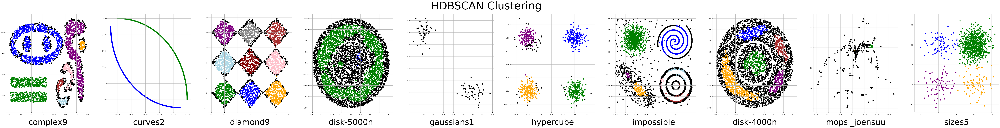

In [115]:
plt.figure(5)
plt.figure(5).suptitle('HDBSCAN Clustering', fontsize=60)
plt.rcParams["figure.figsize"] = (100,10) 
# For complex9 Function 
plt.subplot(1,10,1)
renum_labels_hdb_complex9=renum_label(model_hdb_complex9_labels,colormap)
plt.scatter(np_complex9[:,0],np_complex9[:,1],c= colormap[renum_labels_hdb_complex9])
plt.title("complex9", fontsize=45, y=-0.14) 
plt.grid()
# For curves2 Function from sklearn import metrics
plt.subplot(1,10,2)
renum_labels_hdb_curves2=renum_label(model_hdb_curves2.labels_,colormap)
plt.scatter(np_curves2[:,0],np_curves2[:,1],c=colormap[renum_labels_hdb_curves2])
plt.title("curves2", fontsize=45, y=-0.14) 
plt.grid()
# For diamond9 Function 
plt.subplot(1,10,3)
renum_labels_hdb_diamond9=renum_label(model_hdb_diamond9.labels_,colormap)
plt.scatter(np_diamond9[:,0],np_diamond9[:,1],c=colormap[renum_labels_hdb_diamond9])
plt.title("diamond9", fontsize=45, y=-0.14) 
plt.grid()
# For disk-5000n Function 
plt.subplot(1,10,4)
renum_labels_hdb_disk_5000n=renum_label(model_hdb_disk_5000n.labels_,colormap)
plt.scatter(np_disk_5000n[:,0],np_disk_5000n[:,1],c=colormap[renum_labels_hdb_disk_5000n])
plt.title("disk-5000n", fontsize=45, y=-0.14) 
plt.grid()
# For gaussians1 Function 
plt.subplot(1,10,5)
renum_labels_hdb_gaussians1=renum_label(model_hdb_gaussians1.labels_,colormap)
plt.scatter(np_gaussians1[:,0],np_gaussians1[:,1],c=colormap[renum_labels_hdb_gaussians1])
plt.title("gaussians1", fontsize=45, y=-0.14) 
plt.grid()
# For hypercube Function 
plt.subplot(1,10,6)
renum_labels_hdb_hypercube=renum_label(model_hdb_hypercube.labels_,colormap)
plt.scatter(np_hypercube[:,0],np_hypercube[:,1],c=colormap[renum_labels_hdb_hypercube])
plt.title("hypercube", fontsize=45, y=-0.14) 
plt.grid()
# For impossible Function 
plt.subplot(1,10,7)
renum_labels_hdb_impossible=renum_label(model_hdb_impossible.labels_,colormap)
plt.scatter(np_impossible[:,0],np_impossible[:,1],c=colormap[renum_labels_hdb_impossible])
plt.title("impossible", fontsize=45, y=-0.14) 
plt.grid()
# For disk-4000n Function 
plt.subplot(1,10,8)
renum_labels_hdb_disk_4000n=renum_label(model_hdb_disk_4000n.labels_,colormap)
plt.scatter(np_disk_4000n[:,0],np_disk_4000n[:,1],c=colormap[renum_labels_hdb_disk_4000n])
plt.title("disk-4000n", fontsize=45, y=-0.14) 
plt.grid()
# For mopsi-joensuu Function 
plt.subplot(1,10,9)
renum_labels_hdb_mopsi_joensuu=renum_label(model_hdb_mopsi_joensuu.labels_,colormap)
plt.scatter(np_mopsi_joensuu[:,0],np_mopsi_joensuu[:,1],c=colormap[renum_labels_hdb_mopsi_joensuu])
plt.title("mopsi_joensuu", fontsize=45, y=-0.14) 
plt.grid()
# For sizes5 Function 
plt.subplot(1,10,10)
renum_labels_hdb_sizes5=renum_label(model_hdb_sizes5.labels_,colormap)
plt.scatter(np_sizes5[:,0],np_sizes5[:,1],c=colormap[renum_labels_ms_sizes5])
plt.title("sizes5", fontsize=45, y=-0.14) 
plt.grid()
# Save the plot
plt.savefig('HDBSCAN_Clustering_scatter_plot.png')
plt.show() 